#### Benchmaking Experiment 006b
- benchmarking model architecture -3 with PAMAP2, DaLiAc and UTD-MHAD datasets
- Model : Model4
- Dataset : PAMAP2
- Semantic Space : Glove50
- Cross Validation : 5-fold fixed classes
- Feature Loss : MSELoss

In [42]:
import os 
from datetime import date
from tqdm import tqdm
from copy import deepcopy
import numpy as np 
import pandas as pd
import json

import torch 
from torch import nn, Tensor
from torch.nn import functional as F
from torch.nn.modules import MultiheadAttention, Linear, Dropout, BatchNorm1d, TransformerEncoderLayer
from torch.utils.data import Dataset, DataLoader
from torch.optim import Adam
from torch.nn import MSELoss

import numpy.random as random
from src.datasets.data import PAMAP2ReaderV2
from src.datasets.dataset import PAMAP2Dataset
from src.utils.analysis import action_evaluator
from src.datasets.utils import load_attribute

from src.models.loss import FeatureLoss, AttributeLoss

# from src.running import train_step1, eval_step1

In [43]:
# setup model configurations
config = {
    # general information
    "experiment-name": "test-001", 
    "datetime": date.today(),
    "device": "gpu",
    "dataset": "PAMAP2",
    "Model": "SOTAEmbedding",
    "model_params":{
        "linear_filters":[1024,1024,1024,2048],
        "input_feat":36,
        "dropout":0.1,
    },
    "folding": True,
    "lr": 0.0001,
    "n_epochs": 15,
    "optimizer": "adam",
    "batch_size": 64,
    "seen_split": 0.2,
    "unseen_split": 0.8
}

In [44]:
def save_model(model,model_name,unique_name,fold_id):
    PATH = f"{models_saves}/{model_name}"
    os.makedirs(PATH,exist_ok=True)
    torch.save({
        "n_epochs" : config["n_epochs"],
        "model_state_dict":model.state_dict(),
        "config": config
    }, f"{PATH}/{unique_name}_{fold_id}.pt")

model_iden = "fold"
notebook_iden = "SORTModel_Pose3D_2048"
models_saves = "model_saves"

In [45]:
dataReader = PAMAP2ReaderV2('data/PAMAP2_Dataset/Protocol/')
actionList = dataReader.idToLabel

Reading file 1 of 14
Reading file 2 of 14
Reading file 3 of 14
Reading file 4 of 14
Reading file 5 of 14
Reading file 6 of 14
Reading file 7 of 14
Reading file 8 of 14
Reading file 9 of 14
Reading file 10 of 14
Reading file 11 of 14
Reading file 12 of 14
Reading file 13 of 14
Reading file 14 of 14


D:\FYP\HAR-ZSL-XAI\src\datasets\data.py:525: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.asarray(data), np.asarray(labels, dtype=int), np.array(collection)


[ 1  2  3  4  5  6  7  9 10 11 12 13 16 17 18 19 20 24]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]


Model Building

In [46]:
class SOTAEmbedding(nn.Module):
    def __init__(self, linear_filters=[1024,1024,1024,2048],input_feat=102, dropout=0.1):
        super(SOTAEmbedding, self).__init__()
        self.input_feat = input_feat
        self.linear_filters = linear_filters
        self.input_feat = input_feat
        self.dropout = dropout

        self.linear1 = nn.Linear(input_feat,linear_filters[0])
        self.batch_norm1 = nn.BatchNorm1d(linear_filters[0])
        self.linear2 = nn.Linear(linear_filters[0],linear_filters[1])
        self.batch_norm2 = nn.BatchNorm1d(linear_filters[1])
        self.linear3 = nn.Linear(linear_filters[1],linear_filters[2])
        self.batch_norm3 = nn.BatchNorm1d(linear_filters[2])
        self.linear4 = nn.Linear(linear_filters[2]+linear_filters[1]+linear_filters[0],linear_filters[3])
        self.batch_norm4 = nn.BatchNorm1d(linear_filters[3])
        self.act = F.relu



    def forward(self, x):
        #layer1
        out1 = self.linear1(x)
        out1 = self.batch_norm1(out1)
        out1 = self.act(out1)

        #layer2
        out2 = self.linear2(out1)
        out2 = self.batch_norm2(out2)
        out2 = self.act(out2)

        #layer3
        out3 = self.linear3(out2)
        out3 = self.batch_norm3(out3)
        out3 = self.act(out3)

        concat = torch.cat([out1,out2,out3],-1)

        #layer4
        out4 = self.linear4(concat)
        out4 = self.batch_norm4(out4)
        out4 = self.act(out4)
        return out4

In [47]:
model = SOTAEmbedding(
    linear_filters=config["model_params"]["linear_filters"],
    input_feat=config["model_params"]["input_feat"],
    dropout=config["model_params"]["dropout"]
)

In [48]:
emb = model(torch.randn((32,36)))
emb.size()

torch.Size([32, 2048])

In [49]:
emb

tensor([[3.0971, 1.6177, 2.4999,  ..., 1.1248, 0.0000, 0.0363],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 1.2504, 0.0000],
        [0.0000, 0.0000, 0.8480,  ..., 1.1275, 1.4089, 0.2260],
        ...,
        [0.3187, 0.0000, 0.0000,  ..., 0.0000, 0.5194, 0.0000],
        [0.8152, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.3004, 0.1173, 0.3743,  ..., 0.7435, 0.0000, 1.3573]],
       grad_fn=<ReluBackward0>)

---

In [50]:
from sklearn.metrics import accuracy_score
from sklearn.metrics.pairwise import cosine_similarity

---

In [51]:
if config['device'] == 'cpu':
    device = "cpu"
else:
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [52]:
dataReader.data.shape

(124,)

In [53]:
# run 5-fold running
fold_classes = [['watching TV', 'house cleaning', 'standing', 'ascending stairs'], ['walking', 'rope jumping', 'sitting', 'descending stairs'], ['playing soccer', 'lying', 'vacuum cleaning', 'computer work'], ['cycling', 'running', 'Nordic walking'], ['ironing', 'car driving', 'folding laundry']]

fold_cls_ids = [[actionList.index(i) for i in j] for j in fold_classes]

In [54]:
dts = PAMAP2Dataset

In [55]:
import pickle

with open("E:\\FYP_Data\\Pose3D\\layer3_prototypes.pkl","rb") as f0:
    prototype_map = pickle.load(f0)

In [56]:
video_data = prototype_map
video_classes, video_feat = np.asarray(list(prototype_map.keys())), np.asarray(list(prototype_map.values()))

In [57]:
video_feat.shape,list(prototype_map.keys())

((18, 2048),
 ['Nordic walking',
  'ascending stairs',
  'car driving',
  'computer work',
  'cycling',
  'descending stairs',
  'folding laundry',
  'house cleaning',
  'ironing',
  'lying',
  'playing soccer',
  'rope jumping',
  'running',
  'sitting',
  'standing',
  'vacuum cleaning',
  'walking',
  'watching TV'])

In [58]:
video_classes,len(np.unique(video_classes))

(array(['Nordic walking', 'ascending stairs', 'car driving',
        'computer work', 'cycling', 'descending stairs', 'folding laundry',
        'house cleaning', 'ironing', 'lying', 'playing soccer',
        'rope jumping', 'running', 'sitting', 'standing',
        'vacuum cleaning', 'walking', 'watching TV'], dtype='<U17'),
 18)

In [59]:
vid_cls_name = np.unique(video_classes)

In [60]:
def selecting_video_prototypes(prototypes:np.array,classes:np.array,vid_class_name:np.array):
    selected = []
    for tar in vid_class_name:
        indexes = np.where(classes == tar)
        selected.append(torch.from_numpy(prototypes[random.choice(indexes[0])]))

    return torch.stack(selected)

In [61]:
selecting_video_prototypes(video_feat,video_classes,vid_cls_name).shape

torch.Size([18, 2048])

In [62]:
dataReader.label_map

[(1, 'lying'),
 (2, 'sitting'),
 (3, 'standing'),
 (4, 'walking'),
 (5, 'running'),
 (6, 'cycling'),
 (7, 'Nordic walking'),
 (9, 'watching TV'),
 (10, 'computer work'),
 (11, 'car driving'),
 (12, 'ascending stairs'),
 (13, 'descending stairs'),
 (16, 'vacuum cleaning'),
 (17, 'ironing'),
 (18, 'folding laundry'),
 (19, 'house cleaning'),
 (20, 'playing soccer'),
 (24, 'rope jumping')]

In [63]:
np.unique(video_classes)

array(['Nordic walking', 'ascending stairs', 'car driving',
       'computer work', 'cycling', 'descending stairs', 'folding laundry',
       'house cleaning', 'ironing', 'lying', 'playing soccer',
       'rope jumping', 'running', 'sitting', 'standing',
       'vacuum cleaning', 'walking', 'watching TV'], dtype='<U17')

In [64]:
from collections import defaultdict

label2Id = {c[1]:i for i,c in enumerate(dataReader.label_map)}
action_dict = defaultdict(list)
skeleton_Ids = []
for i, a in enumerate(video_classes):
    action_dict[label2Id[a]].append(i)
    skeleton_Ids.append(label2Id[a])

In [65]:
action_dict

defaultdict(list,
            {6: [0],
             10: [1],
             9: [2],
             8: [3],
             5: [4],
             11: [5],
             14: [6],
             15: [7],
             13: [8],
             0: [9],
             16: [10],
             17: [11],
             4: [12],
             1: [13],
             2: [14],
             12: [15],
             3: [16],
             7: [17]})

In [66]:
data_dict = dataReader.generate(unseen_classes=fold_cls_ids[0], seen_ratio=0.2, unseen_ratio=0.8, window_size=5.21, window_overlap=4.21, resample_freq=20)

per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8, 'ironing': 8, 'folding laundry': 4, 'house cleaning': 5, 'playing soccer': 2, 'rope jumping': 6}
<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>


In [67]:
data_dict['train']['X'].shape,data_dict['train']['y'].shape

((16752, 36), (16752,))

In [68]:
action_dict

defaultdict(list,
            {6: [0],
             10: [1],
             9: [2],
             8: [3],
             5: [4],
             11: [5],
             14: [6],
             15: [7],
             13: [8],
             0: [9],
             16: [10],
             17: [11],
             4: [12],
             1: [13],
             2: [14],
             12: [15],
             3: [16],
             7: [17]})

In [69]:
data_dict['seen_classes']

[0, 1, 3, 4, 5, 6, 8, 9, 11, 12, 13, 14, 16, 17]

In [70]:
sample_dt = PAMAP2Dataset(data=data_dict['train']['X'], actions=data_dict['train']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=data_dict['seen_classes'], seq_len=100)
sample_dl = DataLoader(sample_dt, batch_size=32, shuffle=True, pin_memory=True, drop_last=True)
for d in sample_dl:
    print(100*np.isinf(d[0].numpy()).sum()/(d[0].shape[0]*d[0].shape[1]))

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


In [71]:
sample_dt.action2Id

{0: 0,
 1: 1,
 3: 2,
 4: 3,
 5: 4,
 6: 5,
 8: 6,
 9: 7,
 11: 8,
 12: 9,
 13: 10,
 14: 11,
 16: 12,
 17: 13}

In [72]:
sample_dt.attribute_dict

defaultdict(list,
            {6: [0],
             10: [1],
             9: [2],
             8: [3],
             5: [4],
             11: [5],
             14: [6],
             15: [7],
             13: [8],
             0: [9],
             16: [10],
             17: [11],
             4: [12],
             1: [13],
             2: [14],
             12: [15],
             3: [16],
             7: [17]})

In [73]:
r = sample_dt.getClassAttrs()
r.shape

torch.Size([14, 2048])

In [74]:
def loss_cross_entropy(
        y_pred:torch.Tensor,
        cls:torch.Tensor,
        selected_features,
        loss_fn=nn.CrossEntropyLoss(reduction="sum")
):
    num_classes = selected_features.size()[0]
    #print(selected_features)
    cosine_sim_comb = []
    for entry in y_pred.unbind():
        #print(entry.repeat(num_classes,1),selected_features.size())
        cosine_sim = F.cosine_similarity(entry.repeat(num_classes,1),selected_features)
        cosine_sim_comb.append(cosine_sim)

    cosine_sim_comb = torch.stack(cosine_sim_comb)
    loss = loss_fn(cosine_sim_comb,cls)
    #print(loss)
    return loss

def predict_class(
        y_pred:torch.Tensor,
        selected_features):

    num_classes = selected_features.size()[0]

    cosine_sim_comb = []
    for entry in y_pred.unbind():
        cosine_sim = torch.argmax(F.softmax(F.cosine_similarity(entry.repeat(num_classes,1),selected_features),dim=-1))
        cosine_sim_comb.append(cosine_sim)

    pred = torch.stack(cosine_sim_comb)
    return pred

In [75]:
def loss_reconstruction_calc(y_pred:torch.Tensor,y_feat:torch.Tensor,loss_fn=nn.L1Loss(reduction="sum")):
    bat_size,feature_size = y_pred.size()
    loss = loss_fn(y_pred,y_feat)*(1/feature_size)
    #print(loss)
    return loss

In [76]:
def train_step(model, dataloader, dataset:PAMAP2Dataset, optimizer, loss_module, device, class_names, phase='train', l2_reg=False, loss_alpha=0.7):
    model = model.train()
    epoch_loss = 0  # total loss of epoch
    total_samples = 0  # total samples in epoch
    random_selected_feat = dataset.getClassFeatures().to(device)

    with tqdm(dataloader, unit="batch", desc=phase) as tepoch:
        for batch in tepoch:
            X, targets, target_feat = batch
            X = X.float().to(device)
            target_feat = target_feat.float().to(device)
            targets = targets.long().to(device)

            # Zero gradients, perform a backward pass, and update the weights.
            optimizer.zero_grad()
            # forward
            # track history if only in train
            with torch.set_grad_enabled(phase == 'train'):
            # with autocast():
                feat_output = model(X)
                class_loss = loss_cross_entropy(feat_output,targets.squeeze(),random_selected_feat,loss_fn =loss_module['class'] )
                feat_loss = loss_reconstruction_calc(feat_output,target_feat,loss_fn=loss_module["feature"])

            #loss = cross_entropy_loss
            loss = feat_loss + loss_alpha*class_loss
            class_output = predict_class(feat_output,random_selected_feat)

            if phase == 'train':
                loss.backward()
                optimizer.step()

            metrics = {"loss": loss.item()}
            with torch.no_grad():
                total_samples += len(targets)
                epoch_loss += loss.item()  # add total loss of batch

            # convert feature vector into action class
            # using cosine
            pred_class = class_output.cpu().detach().numpy()
            metrics["accuracy"] = accuracy_score(y_true=targets.cpu().detach().numpy(), y_pred=pred_class)
            tepoch.set_postfix(metrics)

    epoch_loss = epoch_loss / total_samples  # average loss per sample for whole epoch
    return metrics

In [77]:
def eval_step(model, dataloader,dataset, loss_module, device, class_names,  phase='seen', l2_reg=False, print_report=True, loss_alpha=0.7):
    model = model.eval()
    random_selected_feat = dataset.getClassFeatures().to(device)
    epoch_loss = 0  # total loss of epoch
    total_samples = 0  # total samples in epoch
    per_batch = {'target_masks': [], 'targets': [], 'predictions': [], 'metrics': [], 'IDs': []}

    with tqdm(dataloader, unit="batch", desc=phase) as tepoch:
        for batch in tepoch:
            X, targets, target_feat = batch
            X = X.float().to(device)
            X = X.float().to(device)
            target_feat = target_feat.float().to(device)
            targets = targets.long().to(device)

            # forward
            # track history if only in train
            with torch.set_grad_enabled(phase == 'train'):
            # with autocast():
                feat_output = model(X)
                class_loss = loss_cross_entropy(feat_output,targets.squeeze(),random_selected_feat,loss_fn =loss_module['class'] )
                feat_loss = loss_reconstruction_calc(feat_output,target_feat,loss_fn=loss_module["feature"])

            #loss = cross_entropy_loss
            loss = feat_loss + loss_alpha*class_loss
            class_output = predict_class(feat_output,random_selected_feat)

            # convert feature vector into action class
            # using cosine
            if phase == 'seen':
                pred_action = class_output
            else:
                #feat_numpy = torch.sigmoid(feat_output.cpu().detach())
                #action_probs = cosine_similarity(feat_numpy, target_feat_met)
                pred_action = class_output

            per_batch['targets'].append(targets.cpu().numpy())
            per_batch['predictions'].append(pred_action.cpu().numpy())
            per_batch['metrics'].append([loss.cpu().numpy()])

            tepoch.set_postfix({"loss": loss.item()})

    all_preds = np.concatenate(per_batch["predictions"])
    all_targets = np.concatenate(per_batch["targets"])
    metrics_dict = action_evaluator(y_pred=all_preds, y_true=all_targets[:, 0], class_names=class_names, print_report=print_report)
    return metrics_dict

================ Fold-0 ================
Unseen Classes : ['watching TV', 'house cleaning', 'standing', 'ascending stairs']
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8, 'ironing': 8, 'folding laundry': 4, 'house cleaning': 5, 'playing soccer': 2, 'rope jumping': 6}
<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
seen classes >  [0, 1, 3, 4, 5, 6, 8, 9, 11, 12, 13, 14, 16, 17]
unseen classes >  [7, 15, 2, 10]
Initiate IMU datasets ...


Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([14, 2048])



train: 100%|██████████| 261/261 [00:35<00:00,  7.41batch/s, loss=55.5, accuracy=0.438]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 14.29batch/s, loss=51.4]


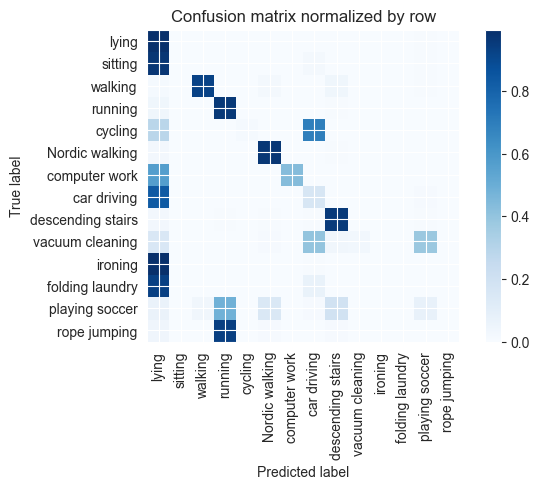

Training Epoch:   7%|▋         | 1/15 [00:40<09:24, 40.31s/it]

Overall accuracy: 0.436

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.996      0.436      0.606      0.144        597|	 lying: 0.564,	rope jumping: 0.000,	
          ironing       0.000      0.000      0.000      0.112        465|	 lying: 0.996,	car driving: 0.004,	rope jumping: 0.000,	
          walking       0.993      0.923      0.956      0.109        452|	 descending stairs: 0.035,	Nordic walking: 0.022,	
            lying       0.187      0.992      0.315      0.089        372|	 playing soccer: 0.005,	descending stairs: 0.003,	
   Nordic walking       0.924      0.967      0.945      0.088        365|	 lying: 0.025,	descending stairs: 0.005,	
          sitting       0.000      0.000      0.000      0.086        358|	 lying: 0.972,	car driving: 0.022,	playing soccer: 0.006,	
  vacuum cleaning       1.000      0.029      0.056      0.084        349|	 car driving: 0.398,	playing soccer: 0.378,	lying: 0.149,	
 


train: 100%|██████████| 261/261 [00:36<00:00,  7.14batch/s, loss=53.2, accuracy=0.422]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:05<00:00, 11.96batch/s, loss=52.7]


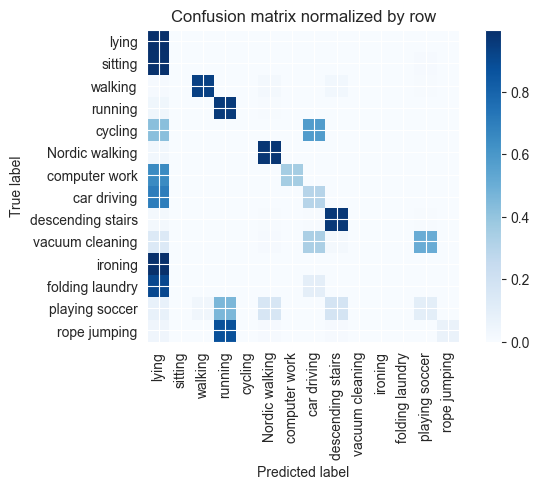

Training Epoch:  13%|█▎        | 2/15 [01:23<09:02, 41.75s/it]

Overall accuracy: 0.428

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.353      0.522      0.143        595|	 lying: 0.647,	rope jumping: 0.000,	
          ironing       0.000      0.000      0.000      0.111        462|	 lying: 0.998,	car driving: 0.002,	rope jumping: 0.000,	
          walking       0.993      0.933      0.962      0.108        451|	 descending stairs: 0.031,	Nordic walking: 0.020,	
            lying       0.181      0.997      0.307      0.089        371|	 playing soccer: 0.003,	rope jumping: 0.000,	
   Nordic walking       0.921      0.972      0.946      0.087        362|	 lying: 0.028,	rope jumping: 0.000,	
          sitting       0.000      0.000      0.000      0.086        357|	 lying: 0.992,	playing soccer: 0.008,	rope jumping: 0.000,	
  vacuum cleaning       0.000      0.000      0.000      0.085        354|	 playing soccer: 0.503,	car driving: 0.333,	lying: 0.133,	
          


train: 100%|██████████| 261/261 [00:40<00:00,  6.43batch/s, loss=51.9, accuracy=0.422]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:05<00:00, 11.77batch/s, loss=50.1]


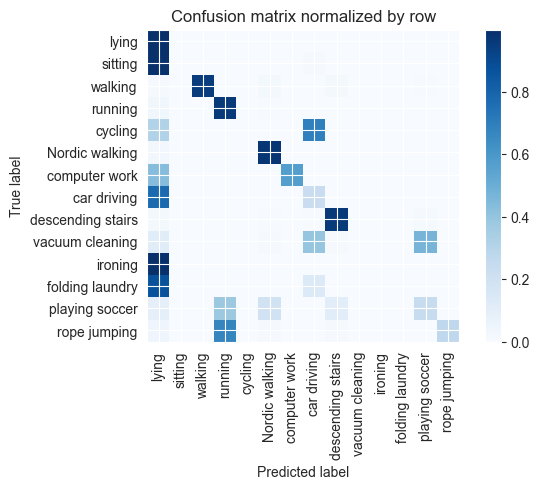

Training Epoch:  20%|██        | 3/15 [02:09<08:48, 44.02s/it]

Overall accuracy: 0.466

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.569      0.725      0.143        596|	 lying: 0.431,	rope jumping: 0.000,	
          ironing       0.000      0.000      0.000      0.111        461|	 lying: 0.998,	car driving: 0.002,	rope jumping: 0.000,	
          walking       1.000      0.949      0.974      0.109        452|	 descending stairs: 0.018,	Nordic walking: 0.018,	
            lying       0.197      0.997      0.329      0.089        369|	 car driving: 0.003,	rope jumping: 0.000,	
   Nordic walking       0.917      0.972      0.944      0.087        363|	 lying: 0.028,	rope jumping: 0.000,	
          sitting       0.000      0.000      0.000      0.086        358|	 lying: 0.992,	car driving: 0.008,	rope jumping: 0.000,	
  vacuum cleaning       0.000      0.000      0.000      0.084        350|	 playing soccer: 0.471,	car driving: 0.397,	lying: 0.114,	
          cyclin


train: 100%|██████████| 261/261 [00:42<00:00,  6.15batch/s, loss=51.2, accuracy=0.594]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:05<00:00, 11.12batch/s, loss=49.6]


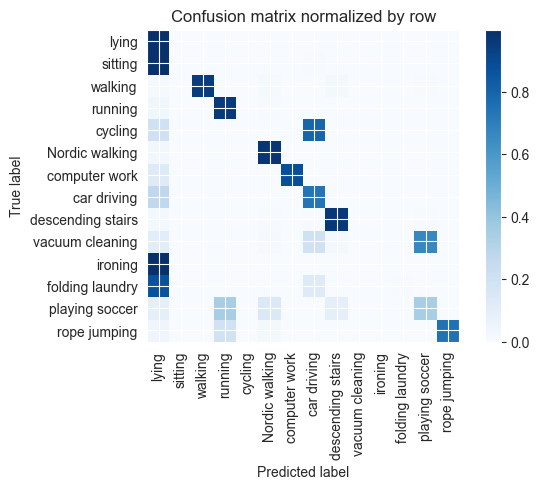

Training Epoch:  27%|██▋       | 4/15 [02:59<08:26, 46.08s/it]

Overall accuracy: 0.537

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.878      0.935      0.143        596|	 lying: 0.122,	rope jumping: 0.000,	
          ironing       0.000      0.000      0.000      0.111        461|	 lying: 0.998,	car driving: 0.002,	rope jumping: 0.000,	
          walking       1.000      0.951      0.975      0.107        445|	 descending stairs: 0.022,	Nordic walking: 0.013,	
            lying       0.231      0.997      0.375      0.089        370|	 playing soccer: 0.003,	rope jumping: 0.000,	
   Nordic walking       0.932      0.973      0.952      0.088        365|	 lying: 0.027,	rope jumping: 0.000,	
          sitting       0.000      0.000      0.000      0.087        360|	 lying: 0.994,	car driving: 0.006,	rope jumping: 0.000,	
  vacuum cleaning       0.000      0.000      0.000      0.085        353|	 playing soccer: 0.663,	car driving: 0.198,	lying: 0.108,	
          cyc


train: 100%|██████████| 261/261 [00:43<00:00,  6.01batch/s, loss=48.9, accuracy=0.5]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:05<00:00, 10.84batch/s, loss=48.1]


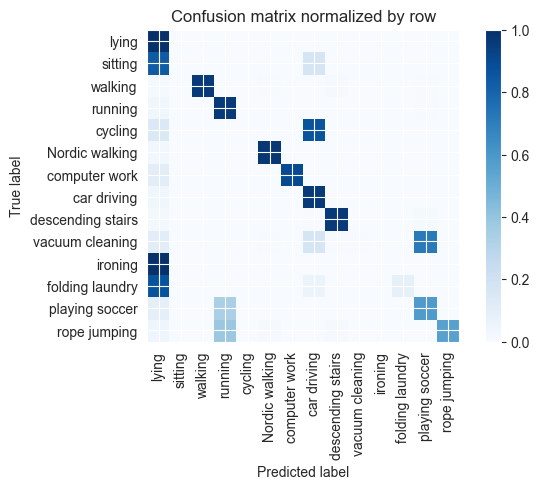

Training Epoch:  33%|███▎      | 5/15 [03:49<07:55, 47.52s/it]

Overall accuracy: 0.553

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.897      0.946      0.143        594|	 lying: 0.103,	rope jumping: 0.000,	
          ironing       0.000      0.000      0.000      0.112        464|	 lying: 0.998,	car driving: 0.002,	rope jumping: 0.000,	
          walking       1.000      0.962      0.981      0.108        451|	 lying: 0.013,	descending stairs: 0.011,	
            lying       0.250      1.000      0.400      0.089        371|	 rope jumping: 0.000,	playing soccer: 0.000,	
   Nordic walking       0.983      0.970      0.976      0.087        364|	 lying: 0.027,	car driving: 0.003,	
          sitting       0.000      0.000      0.000      0.086        356|	 lying: 0.831,	car driving: 0.169,	rope jumping: 0.000,	
  vacuum cleaning       1.000      0.006      0.011      0.084        351|	 playing soccer: 0.712,	car driving: 0.168,	lying: 0.103,	
          cycling      


train: 100%|██████████| 261/261 [00:45<00:00,  5.68batch/s, loss=47.6, accuracy=0.656]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:06<00:00, 10.43batch/s, loss=45.2]


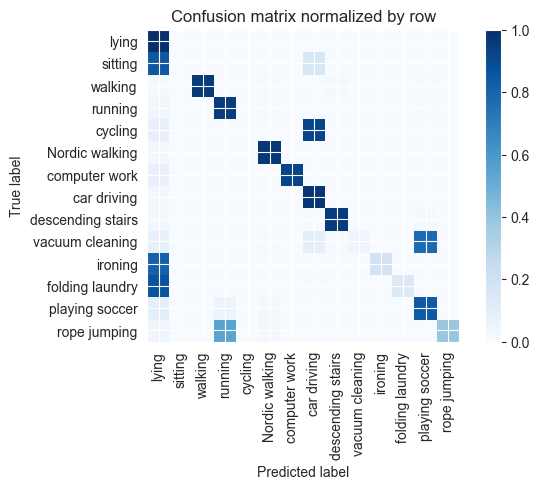

Training Epoch:  40%|████      | 6/15 [04:41<07:24, 49.34s/it]

Overall accuracy: 0.585

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.923      0.960      0.143        595|	 lying: 0.077,	rope jumping: 0.000,	
          ironing       1.000      0.187      0.314      0.111        461|	 lying: 0.811,	car driving: 0.002,	
          walking       1.000      0.965      0.982      0.108        451|	 lying: 0.013,	descending stairs: 0.009,	
            lying       0.272      1.000      0.428      0.089        370|	 rope jumping: 0.000,	playing soccer: 0.000,	
   Nordic walking       0.972      0.970      0.971      0.087        364|	 lying: 0.030,	rope jumping: 0.000,	
          sitting       0.000      0.000      0.000      0.086        356|	 lying: 0.846,	car driving: 0.154,	rope jumping: 0.000,	
  vacuum cleaning       1.000      0.043      0.082      0.084        350|	 playing soccer: 0.771,	car driving: 0.091,	lying: 0.083,	
          cycling       0.000      0.000   


train: 100%|██████████| 261/261 [00:46<00:00,  5.60batch/s, loss=45.6, accuracy=0.734]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:06<00:00, 10.17batch/s, loss=43.7]


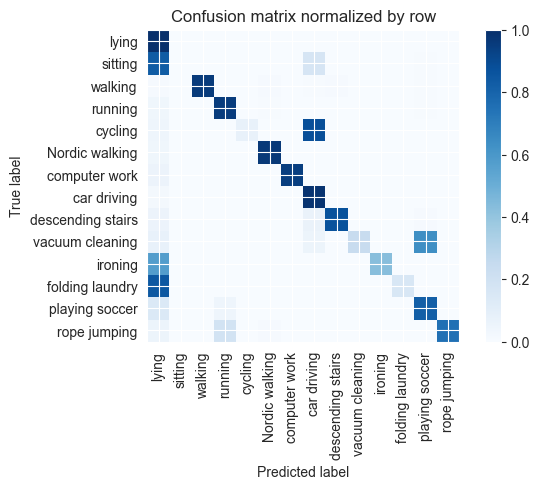

Training Epoch:  47%|████▋     | 7/15 [05:35<06:46, 50.76s/it]

Overall accuracy: 0.639

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.941      0.970      0.144        598|	 lying: 0.059,	rope jumping: 0.000,	
          ironing       1.000      0.427      0.598      0.112        464|	 lying: 0.571,	car driving: 0.002,	
          walking       1.000      0.956      0.977      0.108        451|	 descending stairs: 0.011,	lying: 0.011,	
            lying       0.302      1.000      0.464      0.089        372|	 rope jumping: 0.000,	playing soccer: 0.000,	
   Nordic walking       0.980      0.961      0.971      0.087        363|	 lying: 0.036,	car driving: 0.003,	
          sitting       0.000      0.000      0.000      0.086        358|	 lying: 0.830,	car driving: 0.165,	playing soccer: 0.006,	
  vacuum cleaning       1.000      0.239      0.386      0.084        351|	 playing soccer: 0.635,	lying: 0.071,	
          cycling       1.000      0.074      0.138      0.078


train: 100%|██████████| 261/261 [00:47<00:00,  5.54batch/s, loss=45.5, accuracy=0.562]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:06<00:00,  9.90batch/s, loss=44]


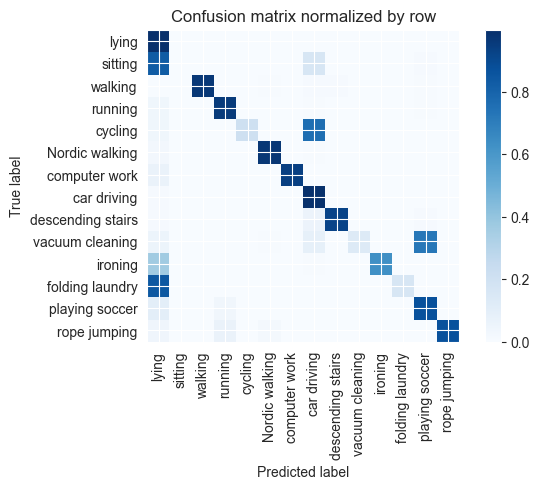

Training Epoch:  53%|█████▎    | 8/15 [06:30<06:03, 51.93s/it]

Overall accuracy: 0.670

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.936      0.967      0.143        593|	 lying: 0.064,	rope jumping: 0.000,	
          ironing       0.997      0.631      0.772      0.111        463|	 lying: 0.365,	car driving: 0.004,	
          walking       1.000      0.962      0.981      0.108        451|	 descending stairs: 0.011,	car driving: 0.011,	
            lying       0.338      0.997      0.504      0.090        373|	 playing soccer: 0.003,	rope jumping: 0.000,	
   Nordic walking       0.983      0.970      0.976      0.087        363|	 lying: 0.025,	car driving: 0.006,	
          sitting       0.000      0.000      0.000      0.086        358|	 lying: 0.830,	car driving: 0.162,	playing soccer: 0.008,	
  vacuum cleaning       1.000      0.131      0.231      0.085        352|	 playing soccer: 0.724,	car driving: 0.082,	
          cycling       1.000      0.204      0.33


train: 100%|██████████| 261/261 [00:47<00:00,  5.46batch/s, loss=43.2, accuracy=0.797]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:06<00:00,  9.69batch/s, loss=44]


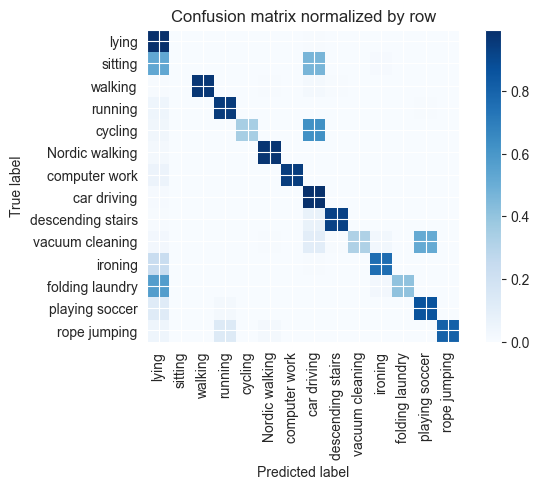

Training Epoch:  60%|██████    | 9/15 [07:25<05:17, 52.99s/it]

Overall accuracy: 0.722

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.941      0.970      0.143        595|	 lying: 0.057,	car driving: 0.002,	
          ironing       0.952      0.760      0.845      0.112        466|	 lying: 0.232,	car driving: 0.006,	
          walking       1.000      0.967      0.983      0.108        451|	 car driving: 0.018,	Nordic walking: 0.007,	
            lying       0.428      0.995      0.598      0.089        372|	 car driving: 0.005,	rope jumping: 0.000,	
   Nordic walking       0.981      0.972      0.976      0.087        362|	 lying: 0.022,	folding laundry: 0.003,	
          sitting       1.000      0.003      0.006      0.086        358|	 lying: 0.525,	car driving: 0.464,	ironing: 0.008,	
  vacuum cleaning       1.000      0.319      0.484      0.085        354|	 playing soccer: 0.514,	car driving: 0.102,	
          cycling       1.000      0.344      0.512      0.0


train: 100%|██████████| 261/261 [00:48<00:00,  5.35batch/s, loss=43.1, accuracy=0.531]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:06<00:00,  9.74batch/s, loss=41.5]


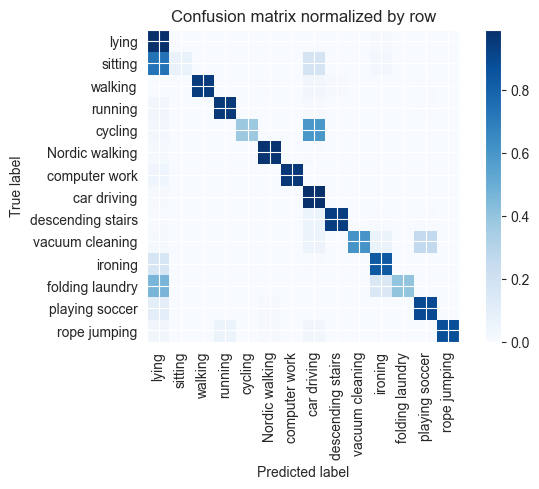

Training Epoch:  67%|██████▋   | 10/15 [08:21<04:29, 53.97s/it]

Overall accuracy: 0.765

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.956      0.978      0.143        594|	 lying: 0.042,	ironing: 0.002,	
          ironing       0.854      0.834      0.844      0.112        464|	 lying: 0.157,	car driving: 0.006,	
          walking       1.000      0.946      0.972      0.108        448|	 car driving: 0.031,	descending stairs: 0.009,	
            lying       0.429      0.987      0.598      0.089        372|	 ironing: 0.008,	playing soccer: 0.003,	
   Nordic walking       0.986      0.972      0.979      0.087        363|	 lying: 0.014,	car driving: 0.006,	
  vacuum cleaning       1.000      0.606      0.754      0.085        355|	 playing soccer: 0.256,	ironing: 0.062,	
          sitting       1.000      0.068      0.127      0.085        355|	 lying: 0.732,	car driving: 0.175,	
          cycling       1.000      0.375      0.545      0.078        323|	 car driving


train: 100%|██████████| 261/261 [00:49<00:00,  5.32batch/s, loss=41.9, accuracy=0.766]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:06<00:00, 10.04batch/s, loss=40.6]


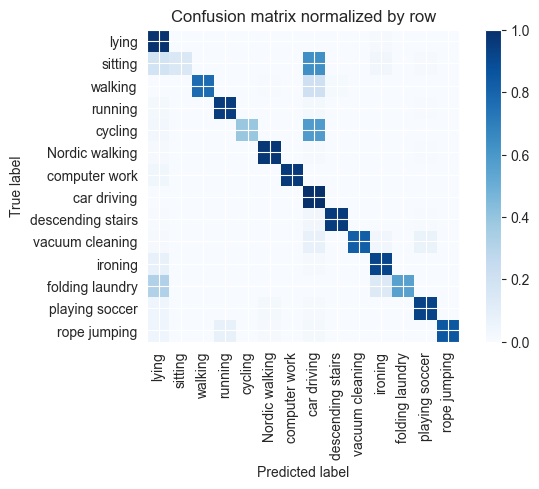

Training Epoch:  73%|███████▎  | 11/15 [09:17<03:38, 54.69s/it]

Overall accuracy: 0.791

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.963      0.981      0.144        597|	 lying: 0.035,	car driving: 0.002,	
          ironing       0.891      0.918      0.904      0.112        464|	 lying: 0.073,	car driving: 0.009,	
          walking       1.000      0.769      0.870      0.108        451|	 car driving: 0.208,	descending stairs: 0.013,	
            lying       0.632      0.987      0.771      0.090        373|	 ironing: 0.008,	playing soccer: 0.003,	
   Nordic walking       0.986      0.973      0.979      0.088        365|	 lying: 0.011,	car driving: 0.008,	
          sitting       1.000      0.141      0.247      0.085        355|	 car driving: 0.631,	lying: 0.186,	
  vacuum cleaning       1.000      0.818      0.900      0.084        351|	 car driving: 0.071,	playing soccer: 0.063,	
          cycling       1.000      0.386      0.557      0.077        321|	 car


train: 100%|██████████| 261/261 [00:48<00:00,  5.35batch/s, loss=40.1, accuracy=0.766]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:06<00:00,  9.62batch/s, loss=40]  


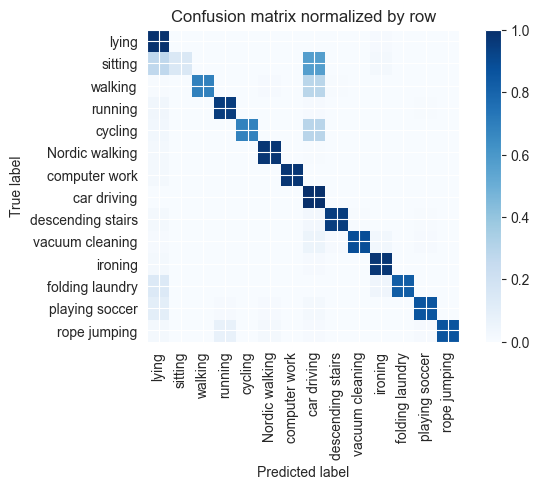

Training Epoch:  80%|████████  | 12/15 [10:14<02:45, 55.16s/it]

Overall accuracy: 0.829

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.976      0.988      0.143        595|	 lying: 0.022,	car driving: 0.002,	
          ironing       0.938      0.974      0.956      0.111        463|	 lying: 0.017,	car driving: 0.009,	
          walking       1.000      0.685      0.813      0.108        448|	 car driving: 0.286,	Nordic walking: 0.011,	
            lying       0.666      0.989      0.796      0.089        371|	 ironing: 0.008,	car driving: 0.003,	
   Nordic walking       0.975      0.975      0.975      0.087        363|	 lying: 0.017,	car driving: 0.006,	
          sitting       1.000      0.146      0.254      0.086        357|	 car driving: 0.569,	lying: 0.266,	
  vacuum cleaning       0.997      0.884      0.937      0.085        354|	 car driving: 0.051,	ironing: 0.031,	
          cycling       1.000      0.680      0.810      0.078        325|	 car driving: 0.2


train: 100%|██████████| 261/261 [00:49<00:00,  5.25batch/s, loss=37.9, accuracy=0.859]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:06<00:00,  9.46batch/s, loss=36.6]


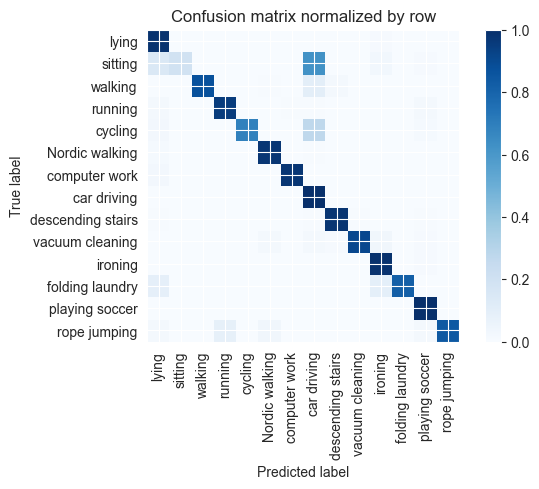

Training Epoch:  87%|████████▋ | 13/15 [11:11<01:51, 55.81s/it]

Overall accuracy: 0.861

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.973      0.986      0.143        595|	 lying: 0.024,	playing soccer: 0.002,	
          ironing       0.911      0.989      0.949      0.112        466|	 playing soccer: 0.009,	lying: 0.002,	
          walking       1.000      0.873      0.932      0.108        449|	 car driving: 0.100,	descending stairs: 0.018,	
            lying       0.777      0.987      0.869      0.089        371|	 ironing: 0.008,	playing soccer: 0.003,	
   Nordic walking       0.970      0.975      0.973      0.088        365|	 lying: 0.014,	car driving: 0.005,	
          sitting       1.000      0.192      0.322      0.086        359|	 car driving: 0.624,	lying: 0.142,	
  vacuum cleaning       0.997      0.909      0.951      0.084        350|	 ironing: 0.031,	car driving: 0.017,	
          cycling       1.000      0.685      0.813      0.078        324|	 car 


train: 100%|██████████| 261/261 [00:49<00:00,  5.27batch/s, loss=36.7, accuracy=0.922]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  9.27batch/s, loss=36.2]


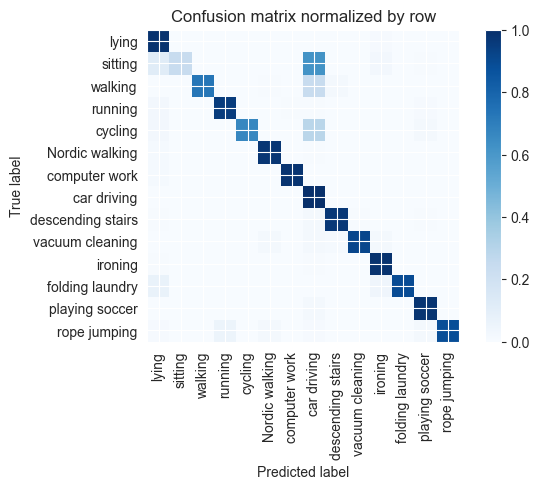

Training Epoch:  93%|█████████▎| 14/15 [12:08<00:56, 56.25s/it]

Overall accuracy: 0.852

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.983      0.991      0.143        594|	 lying: 0.015,	ironing: 0.002,	
          ironing       0.938      0.987      0.962      0.111        461|	 car driving: 0.007,	lying: 0.007,	
          walking       1.000      0.729      0.843      0.108        450|	 car driving: 0.238,	descending stairs: 0.022,	
            lying       0.807      0.987      0.888      0.090        373|	 ironing: 0.008,	playing soccer: 0.003,	
   Nordic walking       0.965      0.975      0.970      0.087        363|	 lying: 0.014,	car driving: 0.006,	
          sitting       1.000      0.237      0.384      0.086        358|	 car driving: 0.617,	lying: 0.115,	
  vacuum cleaning       0.997      0.912      0.952      0.084        351|	 ironing: 0.023,	car driving: 0.023,	
          cycling       1.000      0.668      0.801      0.078        325|	 car driving: 0


train: 100%|██████████| 261/261 [00:49<00:00,  5.22batch/s, loss=37.3, accuracy=0.859]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:06<00:00,  9.37batch/s, loss=34.5]


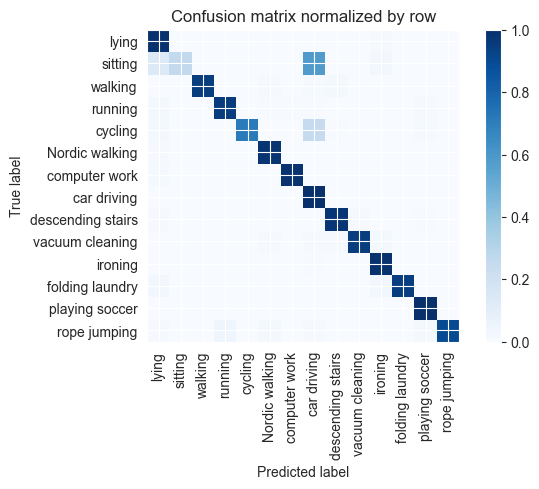

Overall accuracy: 0.890

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.985      0.992      0.143        595|	 lying: 0.013,	ironing: 0.002,	
          ironing       0.943      0.991      0.966      0.111        463|	 car driving: 0.004,	playing soccer: 0.002,	
          walking       1.000      0.949      0.974      0.108        449|	 descending stairs: 0.018,	car driving: 0.016,	
            lying       0.822      0.992      0.899      0.090        373|	 ironing: 0.008,	rope jumping: 0.000,	
   Nordic walking       0.970      0.978      0.974      0.087        363|	 lying: 0.011,	playing soccer: 0.003,	
          sitting       1.000      0.258      0.411      0.086        356|	 car driving: 0.579,	lying: 0.135,	
  vacuum cleaning       0.991      0.946      0.968      0.085        352|	 ironing: 0.020,	descending stairs: 0.011,	
          cycling       1.000      0.711      0.831      0.078        325|

torch.Size([4, 2048])


unseen: 100%|██████████| 87/87 [00:09<00:00,  9.62batch/s, loss=33.6]


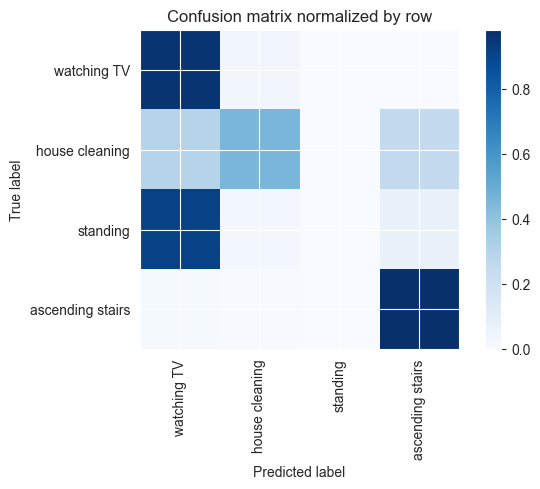

Overall accuracy: 0.480

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.000      0.000      0.000      0.331       1842|	 watching TV: 0.909,	ascending stairs: 0.065,	house cleaning: 0.026,	
  house cleaning       0.910      0.452      0.604      0.327       1823|	 watching TV: 0.295,	ascending stairs: 0.252,	
ascending stairs       0.644      0.980      0.777      0.193       1074|	 watching TV: 0.015,	house cleaning: 0.005,	
     watching TV       0.264      0.963      0.414      0.149        829|	 house cleaning: 0.034,	ascending stairs: 0.004,	

----------------------------------------------------------------------------------------------------
     avg / total       0.462      0.480      0.409        1.0       5568|	      

{'accuracy': 0.48042385057471265, 'precision': 0.45456210234265837, 'recall': 0.5987636676034378, 'f1': 0.44888049795560725}
================ Fold-1 ================
Unseen Classes : ['walkin

Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([14, 2048])



train: 100%|██████████| 262/262 [00:49<00:00,  5.26batch/s, loss=54.2, accuracy=0.625]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  8.58batch/s, loss=55]


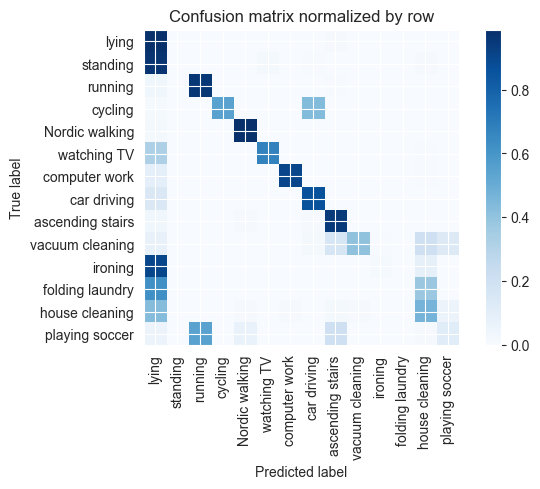

Training Epoch:   7%|▋         | 1/15 [00:58<13:37, 58.39s/it]

Overall accuracy: 0.573

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.993      0.903      0.946      0.149        619|	 lying: 0.092,	house cleaning: 0.005,	
         ironing       0.714      0.012      0.023      0.104        432|	 lying: 0.900,	house cleaning: 0.083,	
           lying       0.234      0.987      0.378      0.089        371|	 ascending stairs: 0.008,	playing soccer: 0.003,	
  Nordic walking       0.968      0.984      0.976      0.089        369|	 lying: 0.016,	playing soccer: 0.000,	
  house cleaning       0.467      0.467      0.467      0.087        360|	 lying: 0.428,	playing soccer: 0.056,	
        standing       0.000      0.000      0.000      0.086        356|	 lying: 0.969,	watching TV: 0.017,	house cleaning: 0.008,	
 vacuum cleaning       0.979      0.404      0.572      0.084        349|	 house cleaning: 0.203,	ascending stairs: 0.155,	
         cycling       0.989      0.544      0.702


train: 100%|██████████| 262/262 [00:53<00:00,  4.91batch/s, loss=52.8, accuracy=0.469]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  9.27batch/s, loss=52.4]


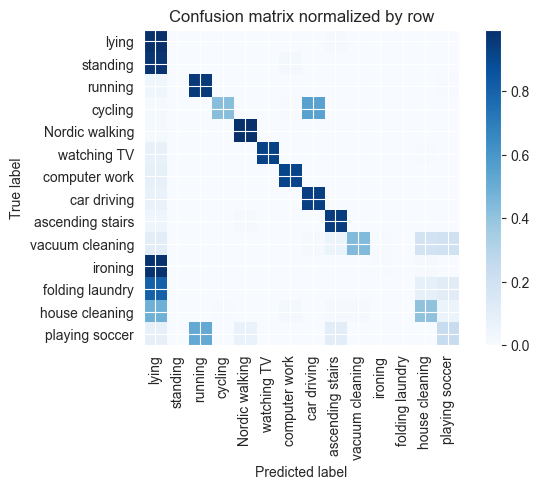

Training Epoch:  13%|█▎        | 2/15 [01:59<13:01, 60.11s/it]

Overall accuracy: 0.577

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.973      0.913      0.942      0.150        622|	 lying: 0.084,	house cleaning: 0.003,	
         ironing       0.500      0.005      0.009      0.105        435|	 lying: 0.984,	house cleaning: 0.011,	
  Nordic walking       0.973      0.986      0.980      0.089        369|	 lying: 0.014,	playing soccer: 0.000,	
           lying       0.226      0.992      0.368      0.089        369|	 ascending stairs: 0.008,	playing soccer: 0.000,	
  house cleaning       0.621      0.404      0.490      0.087        361|	 lying: 0.488,	playing soccer: 0.058,	
        standing       0.000      0.000      0.000      0.085        355|	 lying: 0.975,	computer work: 0.023,	house cleaning: 0.003,	
 vacuum cleaning       0.974      0.439      0.606      0.083        346|	 playing soccer: 0.197,	house cleaning: 0.179,	
         cycling       0.979      0.425      0.593


train: 100%|██████████| 262/262 [00:52<00:00,  4.98batch/s, loss=50.8, accuracy=0.609]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  9.28batch/s, loss=49.8]


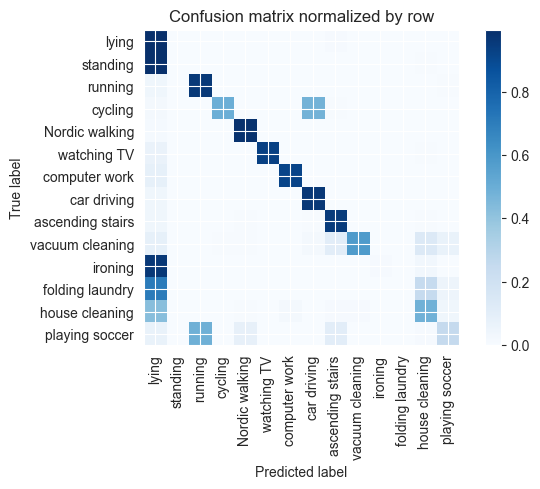

Training Epoch:  20%|██        | 3/15 [03:00<12:02, 60.24s/it]

Overall accuracy: 0.604

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.984      0.913      0.947      0.149        621|	 lying: 0.084,	house cleaning: 0.003,	
         ironing       1.000      0.012      0.023      0.103        430|	 lying: 0.960,	house cleaning: 0.028,	
           lying       0.236      0.992      0.381      0.089        371|	 ascending stairs: 0.008,	playing soccer: 0.000,	
  Nordic walking       0.968      0.986      0.977      0.089        369|	 lying: 0.014,	playing soccer: 0.000,	
  house cleaning       0.602      0.482      0.535      0.087        361|	 lying: 0.427,	playing soccer: 0.036,	
        standing       0.000      0.000      0.000      0.086        358|	 lying: 0.994,	house cleaning: 0.006,	playing soccer: 0.000,	
 vacuum cleaning       0.980      0.580      0.729      0.083        345|	 house cleaning: 0.133,	ascending stairs: 0.104,	
         cycling       0.982      0.496      0.


train: 100%|██████████| 262/262 [00:52<00:00,  5.01batch/s, loss=49.6, accuracy=0.625]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  8.88batch/s, loss=48.4]


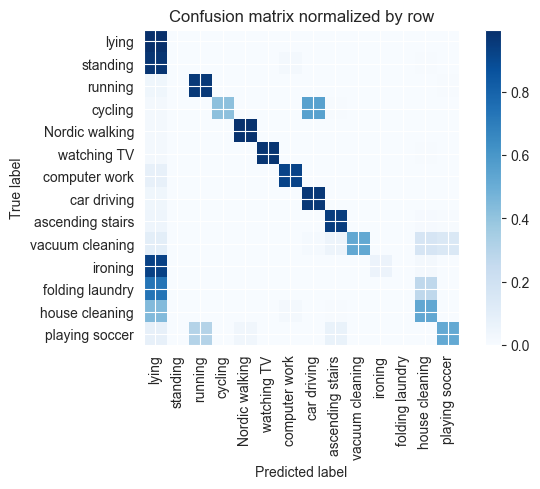

Training Epoch:  27%|██▋       | 4/15 [04:00<11:03, 60.31s/it]

Overall accuracy: 0.608

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.976      0.918      0.946      0.149        621|	 lying: 0.081,	house cleaning: 0.002,	
         ironing       1.000      0.055      0.105      0.105        435|	 lying: 0.926,	house cleaning: 0.018,	
  Nordic walking       0.989      0.984      0.986      0.089        371|	 lying: 0.016,	playing soccer: 0.000,	
           lying       0.235      0.995      0.381      0.088        366|	 house cleaning: 0.003,	ascending stairs: 0.003,	
  house cleaning       0.601      0.528      0.562      0.087        362|	 lying: 0.442,	computer work: 0.017,	
        standing       0.000      0.000      0.000      0.086        357|	 lying: 0.975,	computer work: 0.020,	house cleaning: 0.006,	
 vacuum cleaning       0.995      0.523      0.685      0.084        348|	 house cleaning: 0.167,	playing soccer: 0.144,	
         cycling       0.986      0.415      0.584 


train: 100%|██████████| 262/262 [00:52<00:00,  5.01batch/s, loss=49.6, accuracy=0.578]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  9.12batch/s, loss=48.3]


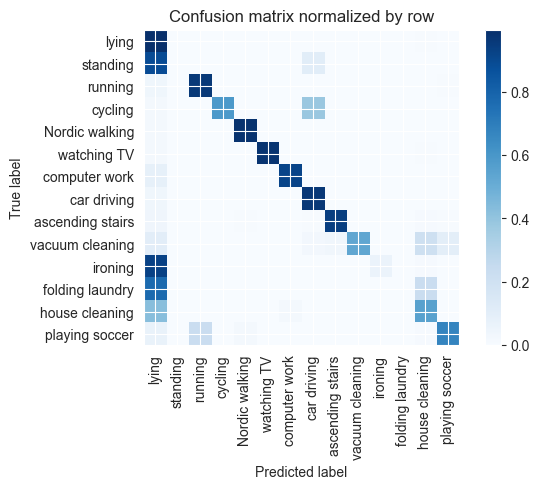

Training Epoch:  33%|███▎      | 5/15 [05:00<10:02, 60.27s/it]

Overall accuracy: 0.629

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.988      0.917      0.951      0.147        612|	 lying: 0.082,	house cleaning: 0.002,	
         ironing       1.000      0.060      0.113      0.104        433|	 lying: 0.928,	house cleaning: 0.012,	
           lying       0.243      0.995      0.390      0.089        372|	 house cleaning: 0.005,	playing soccer: 0.000,	
  Nordic walking       0.992      0.981      0.986      0.089        370|	 lying: 0.016,	house cleaning: 0.003,	
  house cleaning       0.607      0.555      0.580      0.087        364|	 lying: 0.426,	computer work: 0.016,	
        standing       1.000      0.003      0.006      0.086        358|	 lying: 0.888,	car driving: 0.106,	house cleaning: 0.003,	
 vacuum cleaning       1.000      0.530      0.693      0.083        347|	 house cleaning: 0.205,	lying: 0.104,	
         cycling       0.990      0.589      0.738      0.081   


train: 100%|██████████| 262/262 [00:51<00:00,  5.09batch/s, loss=46.6, accuracy=0.656]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  8.93batch/s, loss=46.2]


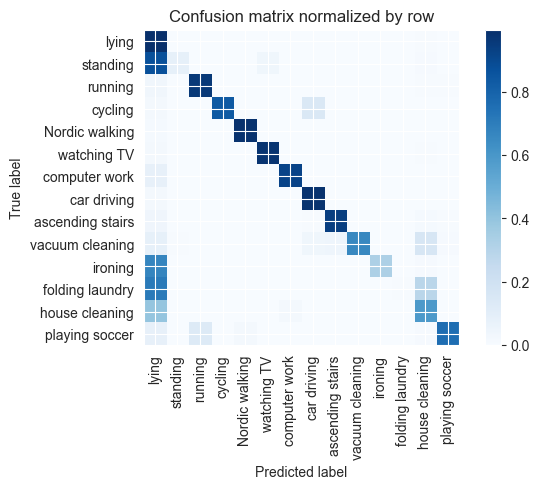

Training Epoch:  40%|████      | 6/15 [06:00<09:00, 60.03s/it]

Overall accuracy: 0.700

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.988      0.918      0.951      0.149        619|	 lying: 0.081,	house cleaning: 0.002,	
         ironing       1.000      0.323      0.488      0.104        434|	 lying: 0.666,	house cleaning: 0.012,	
           lying       0.271      0.995      0.426      0.089        372|	 house cleaning: 0.005,	playing soccer: 0.000,	
  Nordic walking       0.995      0.986      0.990      0.089        369|	 lying: 0.014,	playing soccer: 0.000,	
  house cleaning       0.621      0.588      0.604      0.086        359|	 lying: 0.393,	computer work: 0.017,	
        standing       0.935      0.082      0.151      0.085        354|	 lying: 0.873,	watching TV: 0.037,	
 vacuum cleaning       1.000      0.660      0.795      0.083        347|	 house cleaning: 0.156,	lying: 0.084,	
         cycling       0.993      0.832      0.906      0.082        340|	 car driving:


train: 100%|██████████| 262/262 [00:51<00:00,  5.10batch/s, loss=45, accuracy=0.797]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  9.23batch/s, loss=44]


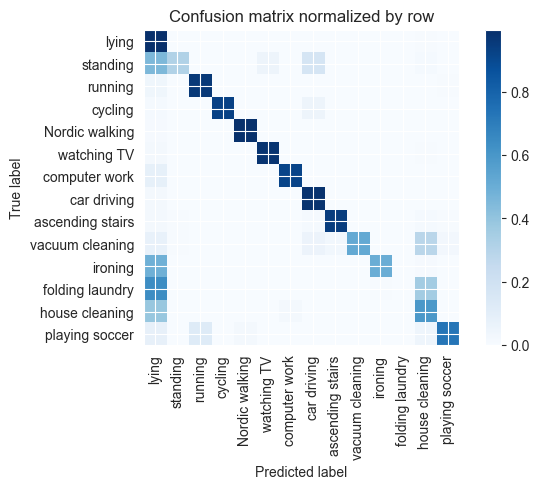

Training Epoch:  47%|████▋     | 7/15 [06:59<07:58, 59.75s/it]

Overall accuracy: 0.733

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.988      0.915      0.950      0.149        620|	 lying: 0.084,	house cleaning: 0.002,	
         ironing       0.995      0.498      0.664      0.104        434|	 lying: 0.486,	house cleaning: 0.012,	
  Nordic walking       0.992      0.989      0.991      0.089        370|	 lying: 0.011,	playing soccer: 0.000,	
           lying       0.329      0.995      0.494      0.089        370|	 house cleaning: 0.005,	playing soccer: 0.000,	
  house cleaning       0.527      0.593      0.558      0.087        361|	 lying: 0.388,	computer work: 0.017,	
        standing       0.974      0.314      0.475      0.086        357|	 lying: 0.454,	car driving: 0.171,	
 vacuum cleaning       1.000      0.517      0.682      0.083        346|	 house cleaning: 0.286,	lying: 0.075,	
         cycling       0.997      0.926      0.960      0.081        339|	 car driving:


train: 100%|██████████| 262/262 [00:50<00:00,  5.15batch/s, loss=44.2, accuracy=0.812]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  9.15batch/s, loss=42.9]


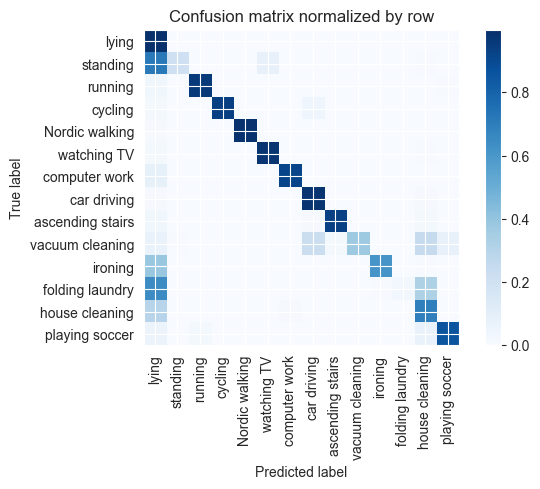

Training Epoch:  53%|█████▎    | 8/15 [07:58<06:55, 59.42s/it]

Overall accuracy: 0.736

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.993      0.917      0.954      0.149        618|	 lying: 0.083,	playing soccer: 0.000,	
         ironing       0.996      0.606      0.754      0.104        434|	 lying: 0.385,	house cleaning: 0.007,	
           lying       0.327      0.997      0.493      0.089        372|	 house cleaning: 0.003,	playing soccer: 0.000,	
  Nordic walking       1.000      0.986      0.993      0.088        368|	 lying: 0.011,	car driving: 0.003,	
  house cleaning       0.598      0.693      0.642      0.087        361|	 lying: 0.294,	computer work: 0.008,	
        standing       0.973      0.203      0.336      0.085        354|	 lying: 0.715,	watching TV: 0.073,	
 vacuum cleaning       1.000      0.372      0.542      0.083        347|	 house cleaning: 0.242,	car driving: 0.225,	
         cycling       0.997      0.935      0.965      0.081        339|	 car drivi


train: 100%|██████████| 262/262 [00:51<00:00,  5.09batch/s, loss=43.8, accuracy=0.672]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  9.11batch/s, loss=41.8]


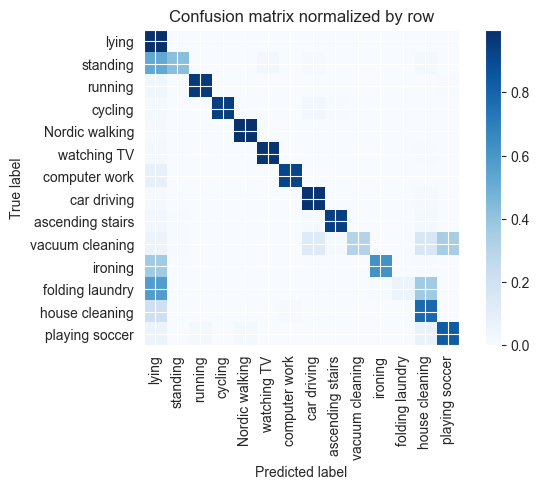

Training Epoch:  60%|██████    | 9/15 [08:57<05:56, 59.44s/it]

Overall accuracy: 0.761

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.995      0.919      0.955      0.148        617|	 lying: 0.081,	playing soccer: 0.000,	
         ironing       0.996      0.623      0.767      0.105        435|	 lying: 0.366,	house cleaning: 0.007,	
  Nordic walking       0.992      0.986      0.989      0.089        370|	 lying: 0.011,	car driving: 0.003,	
           lying       0.367      0.997      0.537      0.089        370|	 house cleaning: 0.003,	playing soccer: 0.000,	
  house cleaning       0.653      0.782      0.712      0.086        357|	 lying: 0.207,	computer work: 0.008,	
        standing       0.974      0.424      0.591      0.086        356|	 lying: 0.525,	watching TV: 0.025,	
 vacuum cleaning       1.000      0.305      0.467      0.084        348|	 playing soccer: 0.345,	house cleaning: 0.149,	
         cycling       0.997      0.944      0.970      0.081        339|	 car dr


train: 100%|██████████| 262/262 [00:51<00:00,  5.06batch/s, loss=43.5, accuracy=0.688]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  9.16batch/s, loss=41.5]


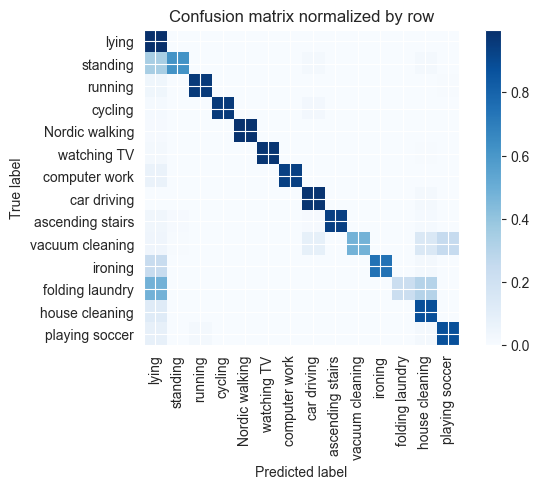

Training Epoch:  67%|██████▋   | 10/15 [09:57<04:57, 59.53s/it]

Overall accuracy: 0.824

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       1.000      0.934      0.966      0.149        621|	 lying: 0.063,	house cleaning: 0.003,	
         ironing       1.000      0.741      0.851      0.104        433|	 lying: 0.238,	house cleaning: 0.016,	
           lying       0.452      0.997      0.622      0.089        371|	 house cleaning: 0.003,	playing soccer: 0.000,	
  Nordic walking       0.997      0.986      0.992      0.088        368|	 lying: 0.011,	car driving: 0.003,	
  house cleaning       0.701      0.878      0.780      0.087        361|	 lying: 0.119,	cycling: 0.003,	
        standing       0.978      0.619      0.758      0.086        357|	 lying: 0.342,	house cleaning: 0.020,	
 vacuum cleaning       1.000      0.476      0.645      0.083        347|	 playing soccer: 0.248,	house cleaning: 0.141,	
         cycling       0.997      0.955      0.976      0.081        335|	 car drivi


train: 100%|██████████| 262/262 [00:51<00:00,  5.08batch/s, loss=40.1, accuracy=0.906]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  8.86batch/s, loss=37.1]


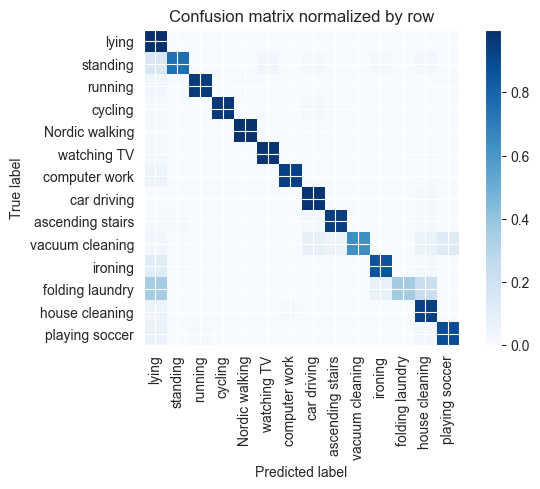

Training Epoch:  73%|███████▎  | 11/15 [10:57<03:58, 59.61s/it]

Overall accuracy: 0.874

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.995      0.935      0.964      0.149        619|	 lying: 0.060,	house cleaning: 0.005,	
         ironing       0.947      0.858      0.900      0.105        436|	 lying: 0.115,	house cleaning: 0.016,	
  Nordic walking       0.997      0.987      0.992      0.089        371|	 lying: 0.008,	car driving: 0.005,	
           lying       0.580      0.997      0.734      0.089        369|	 house cleaning: 0.003,	playing soccer: 0.000,	
  house cleaning       0.781      0.931      0.849      0.087        363|	 lying: 0.055,	computer work: 0.008,	
        standing       0.968      0.755      0.848      0.085        355|	 lying: 0.149,	watching TV: 0.034,	
 vacuum cleaning       1.000      0.635      0.777      0.083        345|	 playing soccer: 0.122,	car driving: 0.078,	
         cycling       0.997      0.965      0.981      0.081        339|	 car drivi


train: 100%|██████████| 262/262 [00:52<00:00,  5.01batch/s, loss=38.9, accuracy=0.875]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  9.05batch/s, loss=41.1]


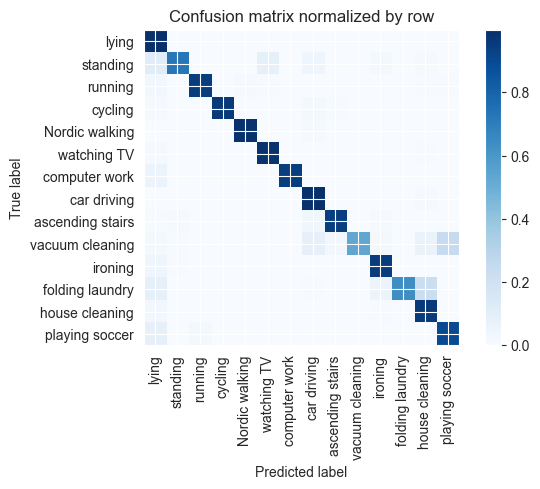

Training Epoch:  80%|████████  | 12/15 [11:57<02:59, 59.80s/it]

Overall accuracy: 0.889

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       1.000      0.944      0.971      0.149        621|	 lying: 0.053,	house cleaning: 0.002,	
         ironing       0.932      0.947      0.940      0.105        436|	 lying: 0.041,	standing: 0.007,	
  Nordic walking       0.995      0.989      0.992      0.089        371|	 car driving: 0.008,	lying: 0.003,	
           lying       0.713      0.997      0.831      0.088        366|	 house cleaning: 0.003,	playing soccer: 0.000,	
  house cleaning       0.818      0.959      0.883      0.087        362|	 lying: 0.030,	ironing: 0.006,	
        standing       0.973      0.724      0.831      0.085        352|	 lying: 0.116,	watching TV: 0.085,	
 vacuum cleaning       1.000      0.530      0.693      0.084        349|	 playing soccer: 0.246,	car driving: 0.080,	
         cycling       0.997      0.961      0.979      0.081        337|	 car driving: 0.021,	l


train: 100%|██████████| 262/262 [00:52<00:00,  5.02batch/s, loss=38.5, accuracy=0.875]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  9.13batch/s, loss=37.7]


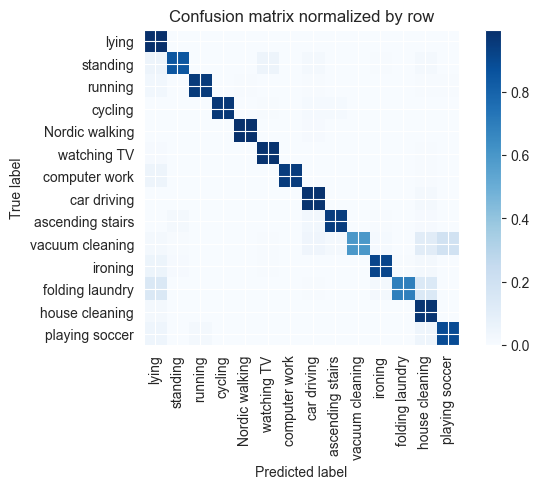

Training Epoch:  87%|████████▋ | 13/15 [12:57<01:59, 59.91s/it]

Overall accuracy: 0.905

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.998      0.945      0.971      0.150        622|	 lying: 0.050,	house cleaning: 0.005,	
         ironing       0.968      0.910      0.938      0.105        435|	 lying: 0.051,	house cleaning: 0.021,	
           lying       0.744      0.995      0.852      0.089        372|	 house cleaning: 0.003,	standing: 0.003,	
  Nordic walking       0.997      0.989      0.993      0.088        367|	 car driving: 0.008,	lying: 0.003,	
  house cleaning       0.782      0.972      0.867      0.086        358|	 lying: 0.022,	folding laundry: 0.003,	
        standing       0.965      0.849      0.903      0.086        357|	 watching TV: 0.050,	lying: 0.050,	
 vacuum cleaning       1.000      0.591      0.743      0.083        347|	 playing soccer: 0.193,	house cleaning: 0.110,	
         cycling       1.000      0.961      0.980      0.081        336|	 ascending 


train: 100%|██████████| 262/262 [00:51<00:00,  5.05batch/s, loss=37.2, accuracy=0.953]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  9.02batch/s, loss=36.2]


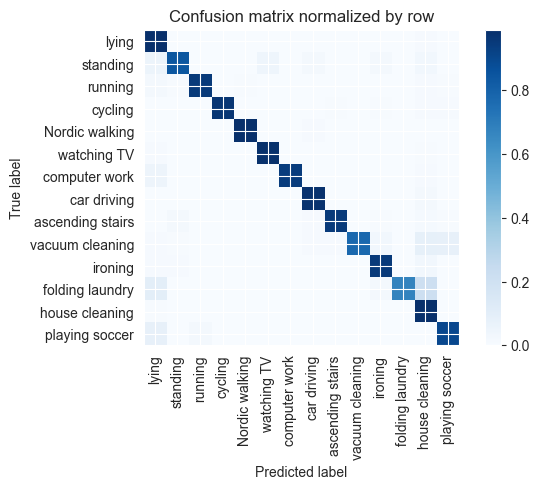

Training Epoch:  93%|█████████▎| 14/15 [13:57<00:59, 59.97s/it]

Overall accuracy: 0.924

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.998      0.940      0.968      0.149        621|	 lying: 0.050,	house cleaning: 0.008,	
         ironing       0.947      0.949      0.948      0.104        431|	 house cleaning: 0.030,	standing: 0.009,	
           lying       0.798      0.989      0.883      0.089        371|	 house cleaning: 0.008,	standing: 0.003,	
  Nordic walking       0.995      0.989      0.992      0.089        370|	 car driving: 0.008,	lying: 0.003,	
  house cleaning       0.761      0.989      0.860      0.087        364|	 lying: 0.005,	computer work: 0.003,	
        standing       0.961      0.842      0.898      0.085        355|	 lying: 0.051,	watching TV: 0.045,	
 vacuum cleaning       1.000      0.773      0.872      0.084        348|	 house cleaning: 0.083,	playing soccer: 0.078,	
         cycling       0.997      0.964      0.980      0.081        336|	 playing s


train: 100%|██████████| 262/262 [00:51<00:00,  5.04batch/s, loss=36.2, accuracy=0.953]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  8.89batch/s, loss=34.9]


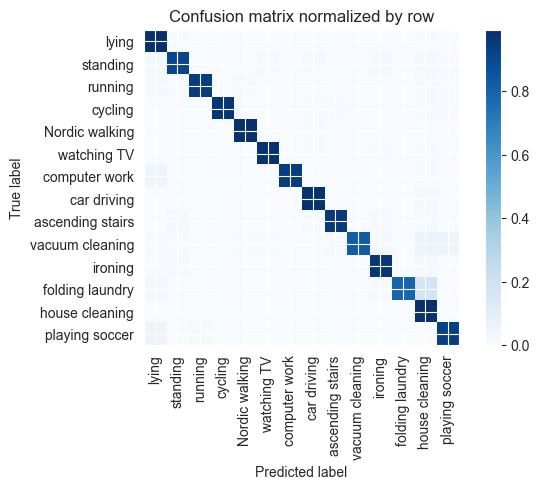

Overall accuracy: 0.942

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       1.000      0.944      0.971      0.149        620|	 lying: 0.048,	house cleaning: 0.006,	
         ironing       0.955      0.966      0.960      0.105        435|	 house cleaning: 0.018,	standing: 0.011,	
  Nordic walking       0.989      0.992      0.991      0.089        370|	 car driving: 0.005,	watching TV: 0.003,	
           lying       0.859      0.989      0.920      0.089        370|	 house cleaning: 0.005,	standing: 0.005,	
  house cleaning       0.803      0.992      0.887      0.086        357|	 folding laundry: 0.003,	cycling: 0.003,	
        standing       0.956      0.908      0.931      0.086        357|	 lying: 0.028,	house cleaning: 0.020,	
 vacuum cleaning       1.000      0.819      0.901      0.084        349|	 playing soccer: 0.060,	house cleaning: 0.060,	
         cycling       0.997      0.967      0.982      0.081        33

torch.Size([4, 2048])


unseen: 100%|██████████| 86/86 [00:10<00:00,  8.07batch/s, loss=43.4]


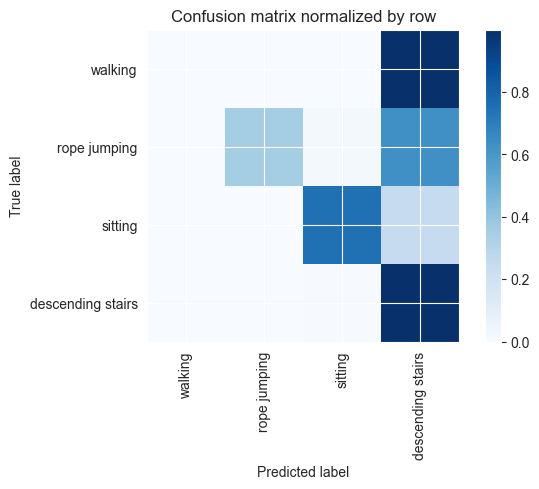

Overall accuracy: 0.443

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.000      0.000      0.000      0.422       2323|	 descending stairs: 1.000,	sitting: 0.000,	rope jumping: 0.000,	
          sitting       0.990      0.753      0.856      0.325       1788|	 descending stairs: 0.247,	rope jumping: 0.000,	
descending stairs       0.234      0.995      0.379      0.170        936|	 sitting: 0.005,	rope jumping: 0.000,	
     rope jumping       1.000      0.352      0.521      0.083        457|	 descending stairs: 0.630,	sitting: 0.018,	

----------------------------------------------------------------------------------------------------
      avg / total       0.444      0.443      0.386        1.0       5504|	      

{'accuracy': 0.44313226744186046, 'precision': 0.5558788888720773, 'recall': 0.5250778543384795, 'f1': 0.43878861876198016}
================ Fold-2 ================
Unseen Classes : ['playing soccer',

Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([14, 2048])



train: 100%|██████████| 242/242 [00:47<00:00,  5.08batch/s, loss=55.4, accuracy=0.328]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:07<00:00,  8.36batch/s, loss=54.2]


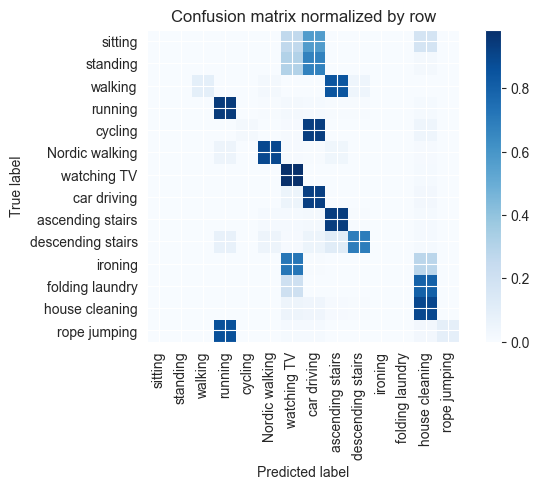

Training Epoch:   7%|▋         | 1/15 [00:55<12:59, 55.66s/it]

Overall accuracy: 0.398

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       1.000      0.090      0.165      0.116        445|	 ascending stairs: 0.845,	descending stairs: 0.045,	
          ironing       0.000      0.000      0.000      0.113        433|	 watching TV: 0.718,	house cleaning: 0.277,	car driving: 0.005,	
   house cleaning       0.469      0.895      0.615      0.097        371|	 watching TV: 0.049,	car driving: 0.040,	
   Nordic walking       0.938      0.891      0.914      0.093        359|	 running: 0.047,	ascending stairs: 0.036,	
          sitting       0.000      0.000      0.000      0.093        357|	 car driving: 0.569,	watching TV: 0.261,	house cleaning: 0.171,	
         standing       0.000      0.000      0.000      0.092        354|	 car driving: 0.672,	watching TV: 0.305,	house cleaning: 0.023,	
          cycling       1.000      0.019      0.036      0.084        323|	 car driving: 0.929,	hou


train: 100%|██████████| 242/242 [00:47<00:00,  5.08batch/s, loss=53.2, accuracy=0.438]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:07<00:00,  8.23batch/s, loss=55.4]


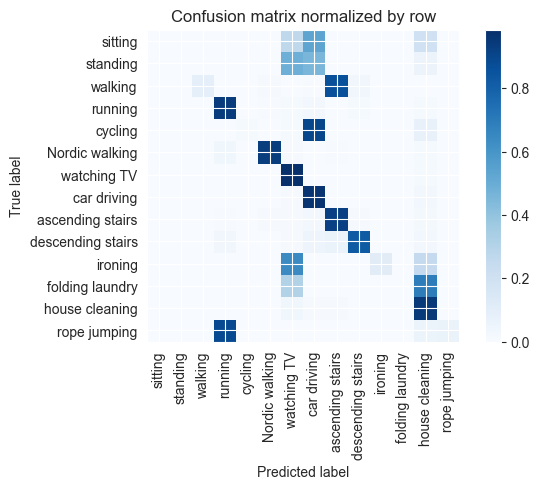

Training Epoch:  13%|█▎        | 2/15 [01:51<12:04, 55.70s/it]

Overall accuracy: 0.423

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       1.000      0.088      0.162      0.115        442|	 ascending stairs: 0.862,	descending stairs: 0.032,	
          ironing       1.000      0.109      0.196      0.113        432|	 watching TV: 0.641,	house cleaning: 0.248,	
   house cleaning       0.475      0.943      0.631      0.096        368|	 watching TV: 0.035,	car driving: 0.011,	
   Nordic walking       0.977      0.934      0.955      0.094        361|	 running: 0.036,	house cleaning: 0.014,	
          sitting       0.000      0.000      0.000      0.094        361|	 car driving: 0.532,	watching TV: 0.269,	house cleaning: 0.199,	
         standing       0.000      0.000      0.000      0.093        359|	 watching TV: 0.487,	car driving: 0.457,	house cleaning: 0.056,	
          cycling       1.000      0.012      0.024      0.085        325|	 car driving: 0.898,	house cleaning: 0.074,	wa


train: 100%|██████████| 242/242 [00:48<00:00,  5.04batch/s, loss=52.1, accuracy=0.406]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:06<00:00,  8.62batch/s, loss=52.6]


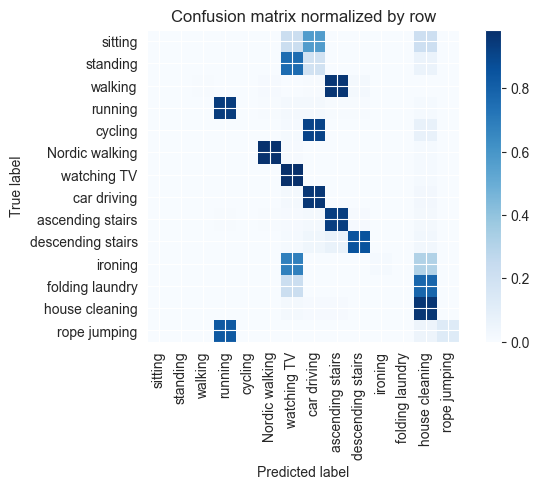

Training Epoch:  20%|██        | 3/15 [02:47<11:10, 55.85s/it]

Overall accuracy: 0.412

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       1.000      0.005      0.009      0.116        444|	 ascending stairs: 0.962,	descending stairs: 0.018,	Nordic walking: 0.009,	
          ironing       1.000      0.012      0.023      0.112        431|	 watching TV: 0.677,	house cleaning: 0.309,	
   house cleaning       0.449      0.959      0.612      0.096        367|	 watching TV: 0.022,	ascending stairs: 0.008,	
          sitting       0.000      0.000      0.000      0.094        362|	 car driving: 0.569,	watching TV: 0.221,	house cleaning: 0.210,	
   Nordic walking       0.983      0.975      0.979      0.093        358|	 house cleaning: 0.014,	watching TV: 0.008,	
         standing       0.000      0.000      0.000      0.092        355|	 watching TV: 0.755,	car driving: 0.186,	house cleaning: 0.059,	
          cycling       1.000      0.003      0.006      0.083        320|	 car driving: 


train: 100%|██████████| 242/242 [00:49<00:00,  4.89batch/s, loss=50.6, accuracy=0.531]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:06<00:00,  8.94batch/s, loss=50.9]


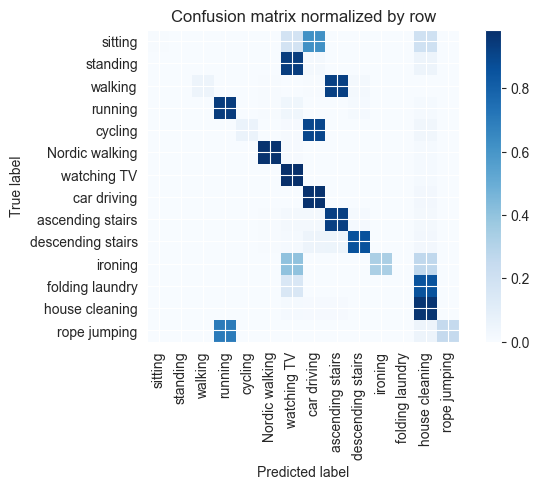

Training Epoch:  27%|██▋       | 4/15 [03:44<10:19, 56.30s/it]

Overall accuracy: 0.459

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       1.000      0.047      0.090      0.116        446|	 ascending stairs: 0.922,	descending stairs: 0.018,	
          ironing       1.000      0.329      0.496      0.112        431|	 watching TV: 0.404,	house cleaning: 0.265,	
   house cleaning       0.464      0.964      0.627      0.095        365|	 watching TV: 0.014,	car driving: 0.011,	
          sitting       1.000      0.006      0.011      0.094        362|	 car driving: 0.616,	house cleaning: 0.199,	watching TV: 0.180,	
   Nordic walking       0.983      0.972      0.978      0.094        361|	 house cleaning: 0.014,	watching TV: 0.008,	
         standing       0.000      0.000      0.000      0.093        357|	 watching TV: 0.933,	house cleaning: 0.048,	car driving: 0.020,	
          cycling       1.000      0.059      0.111      0.084        323|	 car driving: 0.898,	house cleaning: 0.034


train: 100%|██████████| 242/242 [00:47<00:00,  5.10batch/s, loss=49.2, accuracy=0.531]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:06<00:00,  9.03batch/s, loss=49.9]


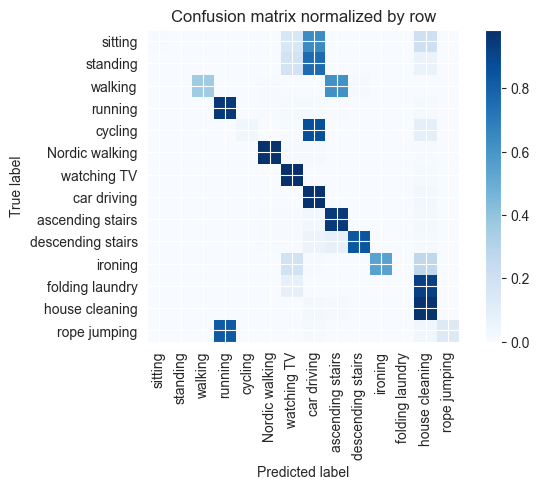

Training Epoch:  33%|███▎      | 5/15 [04:39<09:19, 55.94s/it]

Overall accuracy: 0.518

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       1.000      0.361      0.530      0.116        446|	 ascending stairs: 0.619,	descending stairs: 0.009,	
          ironing       0.996      0.543      0.703      0.112        431|	 house cleaning: 0.267,	watching TV: 0.186,	
   house cleaning       0.449      0.970      0.614      0.096        367|	 car driving: 0.016,	ascending stairs: 0.008,	
          sitting       1.000      0.005      0.011      0.095        365|	 car driving: 0.636,	house cleaning: 0.203,	watching TV: 0.153,	
   Nordic walking       0.983      0.975      0.979      0.093        358|	 car driving: 0.011,	watching TV: 0.008,	
         standing       0.000      0.000      0.000      0.092        355|	 car driving: 0.758,	watching TV: 0.177,	house cleaning: 0.065,	
          cycling       1.000      0.037      0.072      0.084        321|	 car driving: 0.869,	house cleaning: 0.0


train: 100%|██████████| 242/242 [00:47<00:00,  5.10batch/s, loss=48.6, accuracy=0.578]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:06<00:00,  8.70batch/s, loss=48.4]


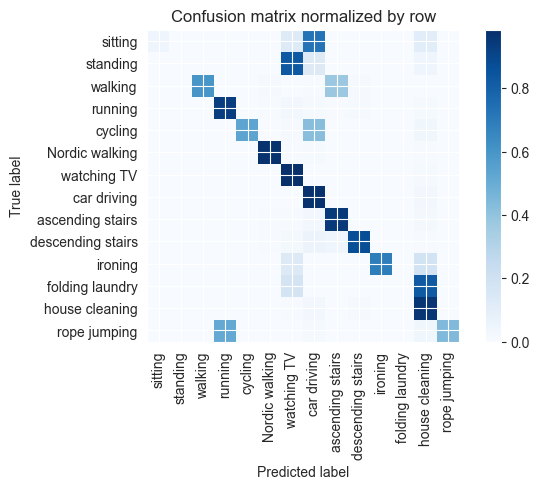

Training Epoch:  40%|████      | 6/15 [05:35<08:22, 55.79s/it]

Overall accuracy: 0.614

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       1.000      0.596      0.747      0.115        443|	 ascending stairs: 0.377,	descending stairs: 0.011,	
          ironing       0.997      0.687      0.813      0.113        434|	 house cleaning: 0.184,	watching TV: 0.127,	
   house cleaning       0.523      0.960      0.677      0.097        371|	 car driving: 0.024,	descending stairs: 0.008,	
          sitting       1.000      0.042      0.080      0.094        360|	 car driving: 0.728,	watching TV: 0.122,	house cleaning: 0.106,	
   Nordic walking       0.980      0.975      0.978      0.093        359|	 car driving: 0.014,	house cleaning: 0.006,	
         standing       0.000      0.000      0.000      0.092        353|	 watching TV: 0.827,	car driving: 0.127,	house cleaning: 0.045,	
          cycling       1.000      0.531      0.694      0.083        318|	 car driving: 0.421,	house cleaning:


train: 100%|██████████| 242/242 [00:47<00:00,  5.10batch/s, loss=48.2, accuracy=0.406]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:07<00:00,  8.34batch/s, loss=46.2]


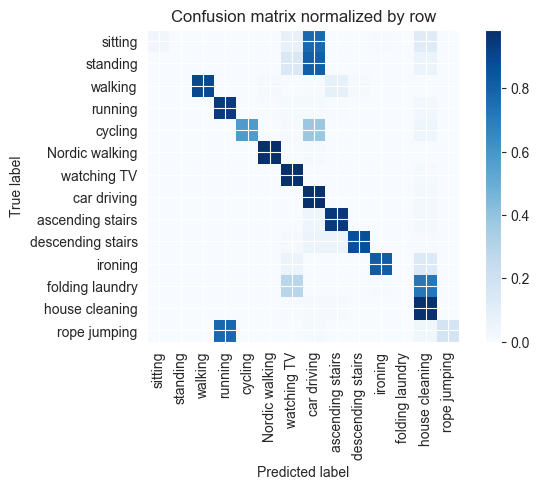

Training Epoch:  47%|████▋     | 7/15 [06:30<07:25, 55.67s/it]

Overall accuracy: 0.661

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       1.000      0.892      0.943      0.116        445|	 ascending stairs: 0.083,	descending stairs: 0.009,	
          ironing       0.992      0.815      0.895      0.113        432|	 house cleaning: 0.132,	watching TV: 0.051,	
   house cleaning       0.555      0.975      0.708      0.096        367|	 car driving: 0.011,	ascending stairs: 0.008,	
   Nordic walking       0.986      0.978      0.982      0.094        361|	 car driving: 0.014,	watching TV: 0.006,	
          sitting       1.000      0.033      0.064      0.094        361|	 car driving: 0.770,	house cleaning: 0.116,	watching TV: 0.075,	
         standing       0.000      0.000      0.000      0.092        355|	 car driving: 0.806,	watching TV: 0.141,	house cleaning: 0.054,	
          cycling       1.000      0.573      0.728      0.084        323|	 car driving: 0.375,	house cleaning: 0.0


train: 100%|██████████| 242/242 [00:47<00:00,  5.07batch/s, loss=45.6, accuracy=0.641]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:07<00:00,  8.28batch/s, loss=46.6]


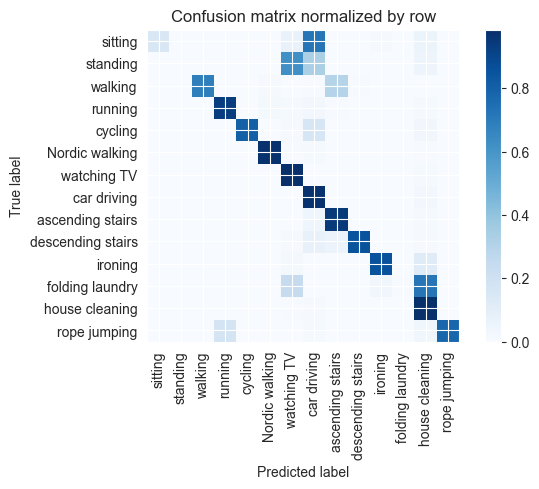

Training Epoch:  53%|█████▎    | 8/15 [07:26<06:29, 55.71s/it]

Overall accuracy: 0.683

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       1.000      0.684      0.812      0.116        446|	 ascending stairs: 0.294,	Nordic walking: 0.009,	
          ironing       0.976      0.861      0.915      0.113        433|	 house cleaning: 0.115,	watching TV: 0.021,	
   house cleaning       0.583      0.981      0.732      0.095        364|	 car driving: 0.011,	watching TV: 0.005,	
          sitting       1.000      0.150      0.260      0.094        361|	 car driving: 0.720,	watching TV: 0.066,	
   Nordic walking       0.980      0.975      0.978      0.094        360|	 car driving: 0.014,	house cleaning: 0.006,	
         standing       0.000      0.000      0.000      0.092        355|	 watching TV: 0.623,	car driving: 0.330,	house cleaning: 0.048,	
          cycling       1.000      0.802      0.890      0.084        323|	 car driving: 0.155,	house cleaning: 0.034,	
 ascending stairs      


train: 100%|██████████| 242/242 [00:47<00:00,  5.08batch/s, loss=45.2, accuracy=0.672]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:07<00:00,  8.44batch/s, loss=42.7]


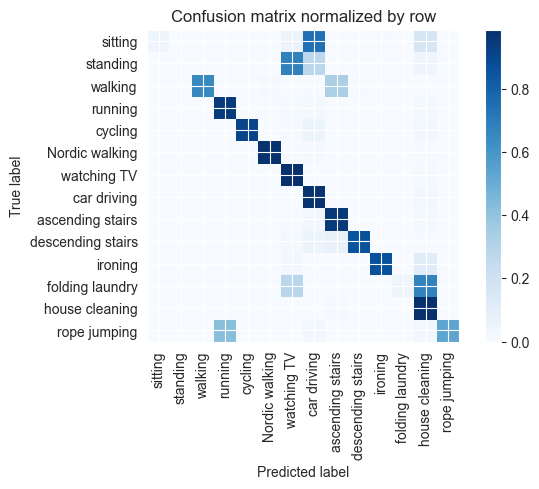

Training Epoch:  60%|██████    | 9/15 [08:22<05:34, 55.67s/it]

Overall accuracy: 0.676

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       1.000      0.651      0.789      0.116        444|	 ascending stairs: 0.329,	Nordic walking: 0.009,	
          ironing       0.995      0.860      0.923      0.112        430|	 house cleaning: 0.114,	watching TV: 0.023,	
   house cleaning       0.565      0.986      0.719      0.096        368|	 ascending stairs: 0.008,	car driving: 0.003,	
          sitting       1.000      0.039      0.074      0.095        363|	 car driving: 0.741,	house cleaning: 0.160,	watching TV: 0.055,	
   Nordic walking       0.986      0.978      0.982      0.093        358|	 car driving: 0.011,	house cleaning: 0.006,	
         standing       0.000      0.000      0.000      0.093        357|	 watching TV: 0.678,	car driving: 0.277,	house cleaning: 0.045,	
          cycling       1.000      0.907      0.951      0.084        323|	 car driving: 0.059,	house cleaning: 0.0


train: 100%|██████████| 242/242 [00:48<00:00,  4.99batch/s, loss=44.1, accuracy=0.703]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:06<00:00,  8.86batch/s, loss=42.4]


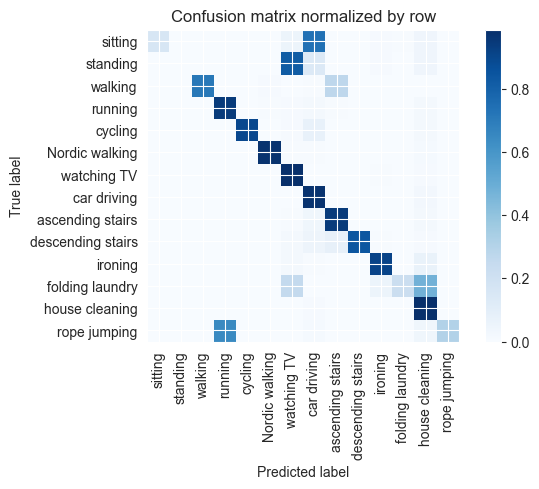

Training Epoch:  67%|██████▋   | 10/15 [09:18<04:39, 55.82s/it]

Overall accuracy: 0.702

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       1.000      0.712      0.832      0.115        441|	 ascending stairs: 0.272,	Nordic walking: 0.009,	
          ironing       0.954      0.910      0.932      0.113        435|	 house cleaning: 0.069,	watching TV: 0.016,	
   house cleaning       0.672      0.987      0.799      0.097        371|	 car driving: 0.008,	ascending stairs: 0.003,	
   Nordic walking       0.986      0.975      0.980      0.093        359|	 house cleaning: 0.014,	car driving: 0.006,	
          sitting       1.000      0.156      0.270      0.093        359|	 car driving: 0.738,	watching TV: 0.050,	
         standing       0.000      0.000      0.000      0.093        357|	 watching TV: 0.821,	car driving: 0.132,	house cleaning: 0.039,	
          cycling       1.000      0.895      0.945      0.084        324|	 car driving: 0.074,	house cleaning: 0.022,	
 ascending stairs 


train: 100%|██████████| 242/242 [00:47<00:00,  5.08batch/s, loss=44.7, accuracy=0.531]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:06<00:00,  8.72batch/s, loss=40.1]


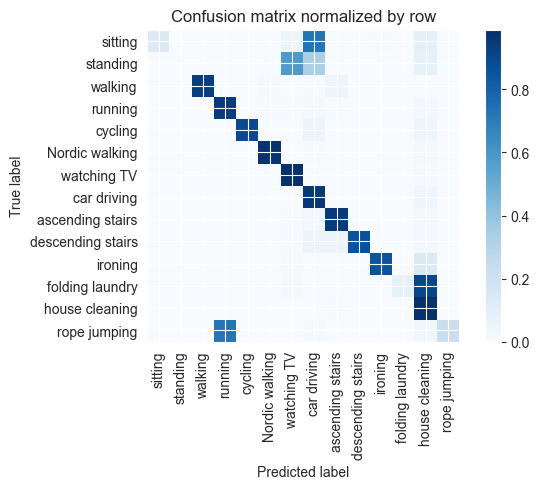

Training Epoch:  73%|███████▎  | 11/15 [10:13<03:42, 55.71s/it]

Overall accuracy: 0.710

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       1.000      0.932      0.965      0.115        443|	 ascending stairs: 0.050,	Nordic walking: 0.009,	
          ironing       0.992      0.852      0.917      0.113        433|	 house cleaning: 0.136,	watching TV: 0.009,	
   house cleaning       0.518      0.989      0.680      0.096        368|	 ascending stairs: 0.005,	car driving: 0.003,	
          sitting       1.000      0.124      0.221      0.094        362|	 car driving: 0.729,	house cleaning: 0.088,	
   Nordic walking       0.986      0.975      0.980      0.093        357|	 house cleaning: 0.017,	car driving: 0.006,	
         standing       0.000      0.000      0.000      0.093        356|	 watching TV: 0.581,	car driving: 0.331,	house cleaning: 0.084,	
          cycling       1.000      0.892      0.943      0.084        323|	 car driving: 0.059,	house cleaning: 0.046,	
 ascending stai


train: 100%|██████████| 242/242 [00:48<00:00,  5.02batch/s, loss=42.1, accuracy=0.703]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:06<00:00,  8.77batch/s, loss=41.7]


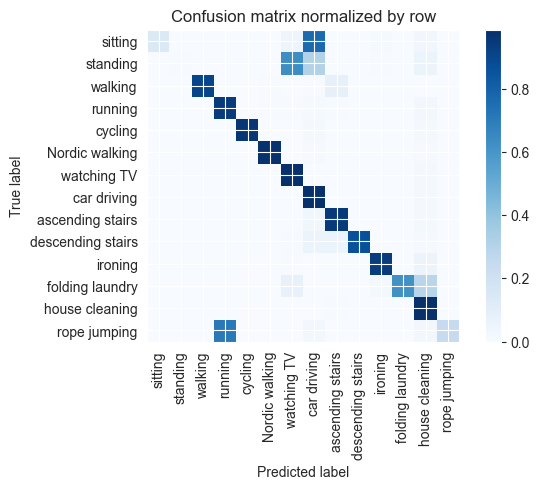

Training Epoch:  80%|████████  | 12/15 [11:09<02:47, 55.75s/it]

Overall accuracy: 0.751

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       1.000      0.908      0.952      0.116        444|	 ascending stairs: 0.079,	Nordic walking: 0.007,	
          ironing       0.974      0.938      0.955      0.113        432|	 house cleaning: 0.056,	watching TV: 0.005,	
   house cleaning       0.721      0.986      0.833      0.095        365|	 ascending stairs: 0.005,	folding laundry: 0.003,	
          sitting       1.000      0.138      0.242      0.095        363|	 car driving: 0.766,	watching TV: 0.047,	
   Nordic walking       0.989      0.978      0.983      0.094        360|	 car driving: 0.011,	house cleaning: 0.008,	
         standing       1.000      0.006      0.011      0.093        359|	 watching TV: 0.630,	car driving: 0.309,	house cleaning: 0.050,	
          cycling       1.000      0.960      0.979      0.084        321|	 house cleaning: 0.022,	car driving: 0.016,	
 ascending sta


train: 100%|██████████| 242/242 [00:48<00:00,  5.03batch/s, loss=40.8, accuracy=0.75]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:06<00:00,  8.92batch/s, loss=38.9]


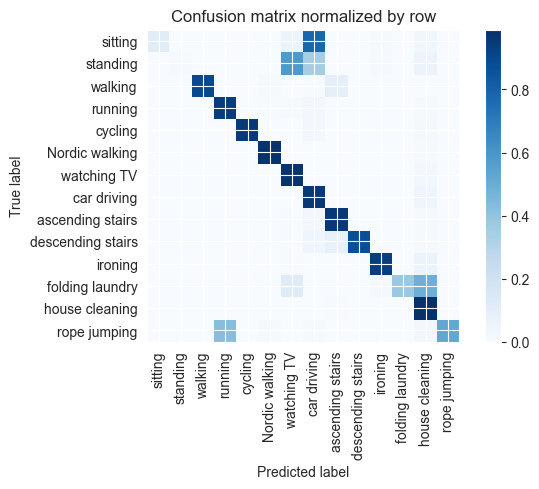

Training Epoch:  87%|████████▋ | 13/15 [12:05<01:51, 55.72s/it]

Overall accuracy: 0.741

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       1.000      0.893      0.943      0.114        439|	 ascending stairs: 0.091,	Nordic walking: 0.009,	
          ironing       0.976      0.933      0.954      0.113        434|	 house cleaning: 0.060,	watching TV: 0.005,	
   house cleaning       0.664      0.989      0.795      0.096        370|	 ascending stairs: 0.005,	car driving: 0.003,	
         standing       1.000      0.008      0.017      0.094        360|	 watching TV: 0.583,	car driving: 0.344,	house cleaning: 0.056,	
          sitting       1.000      0.111      0.200      0.094        360|	 car driving: 0.781,	watching TV: 0.058,	
   Nordic walking       0.983      0.980      0.982      0.093        357|	 house cleaning: 0.014,	car driving: 0.003,	
          cycling       1.000      0.953      0.976      0.084        322|	 car driving: 0.025,	house cleaning: 0.019,	
 ascending stairs 


train: 100%|██████████| 242/242 [00:48<00:00,  5.03batch/s, loss=39.2, accuracy=0.656]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:07<00:00,  8.12batch/s, loss=40.5]


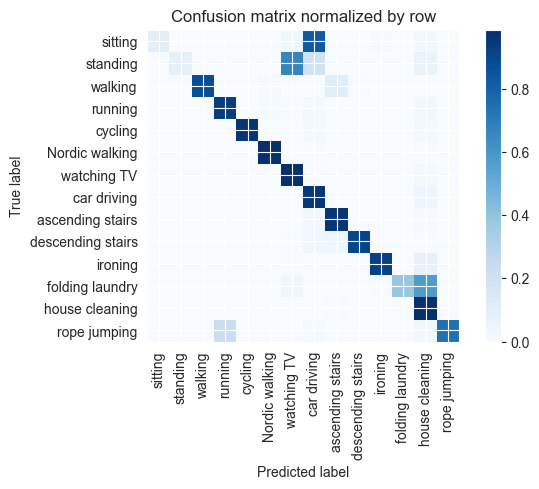

Training Epoch:  93%|█████████▎| 14/15 [13:01<00:55, 55.92s/it]

Overall accuracy: 0.752

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       1.000      0.872      0.932      0.114        438|	 ascending stairs: 0.107,	Nordic walking: 0.009,	
          ironing       0.988      0.922      0.954      0.113        434|	 house cleaning: 0.071,	watching TV: 0.005,	
   house cleaning       0.642      0.987      0.778      0.097        371|	 ascending stairs: 0.005,	descending stairs: 0.003,	
          sitting       1.000      0.099      0.180      0.095        363|	 car driving: 0.824,	watching TV: 0.036,	
   Nordic walking       0.983      0.986      0.985      0.093        359|	 house cleaning: 0.006,	car driving: 0.006,	
         standing       1.000      0.082      0.151      0.092        355|	 watching TV: 0.662,	car driving: 0.192,	
          cycling       1.000      0.960      0.979      0.084        322|	 house cleaning: 0.019,	car driving: 0.016,	
 ascending stairs       0.785      


train: 100%|██████████| 242/242 [00:48<00:00,  5.03batch/s, loss=37.8, accuracy=0.875]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:06<00:00,  8.62batch/s, loss=40]


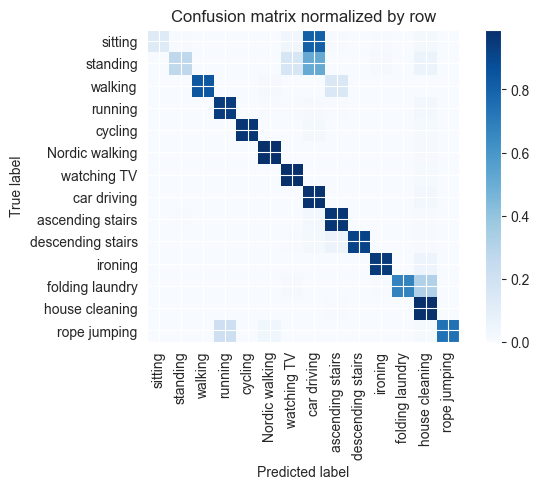

Overall accuracy: 0.787

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       1.000      0.841      0.914      0.115        441|	 ascending stairs: 0.143,	Nordic walking: 0.009,	
          ironing       0.983      0.947      0.965      0.113        433|	 house cleaning: 0.048,	folding laundry: 0.002,	
   house cleaning       0.738      0.989      0.845      0.096        370|	 ascending stairs: 0.005,	descending stairs: 0.003,	
          sitting       1.000      0.122      0.217      0.094        362|	 car driving: 0.807,	watching TV: 0.033,	
   Nordic walking       0.978      0.983      0.980      0.093        356|	 house cleaning: 0.011,	car driving: 0.003,	
         standing       0.969      0.267      0.419      0.093        356|	 car driving: 0.508,	watching TV: 0.160,	
          cycling       1.000      0.966      0.983      0.084        323|	 car driving: 0.015,	house cleaning: 0.012,	
 ascending stairs       0.732  

unseen: 100%|██████████| 111/111 [00:11<00:00,  9.56batch/s, loss=49.4]


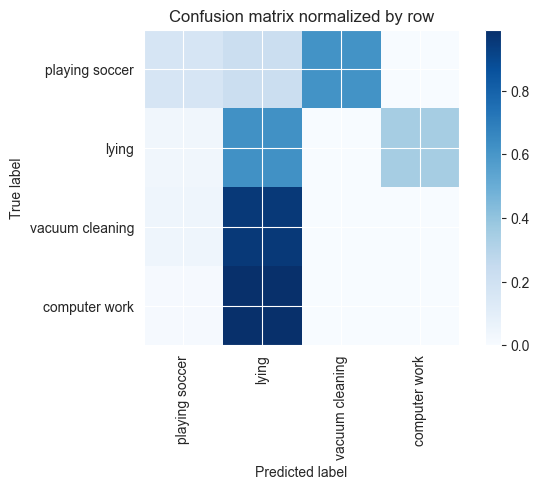

Overall accuracy: 0.175

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.000      0.000      0.000      0.431       3065|	 lying: 0.991,	playing soccer: 0.009,	vacuum cleaning: 0.001,	
          lying       0.196      0.621      0.298      0.264       1877|	 computer work: 0.347,	playing soccer: 0.031,	
vacuum cleaning       0.000      0.000      0.000      0.240       1705|	 lying: 0.955,	playing soccer: 0.045,	computer work: 0.000,	
 playing soccer       0.319      0.166      0.219      0.064        457|	 vacuum cleaning: 0.615,	lying: 0.219,	

----------------------------------------------------------------------------------------------------
    avg / total       0.072      0.175      0.093        1.0       7104|	      

{'accuracy': 0.17469031531531531, 'precision': 0.12894660393668428, 'recall': 0.19674331333229966, 'f1': 0.12928878621196804}
================ Fold-3 ================
Unseen Classes : ['cycling', 'r

Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([15, 2048])



train: 100%|██████████| 276/276 [00:53<00:00,  5.13batch/s, loss=52.8, accuracy=0.609]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:08<00:00,  8.56batch/s, loss=54.5]


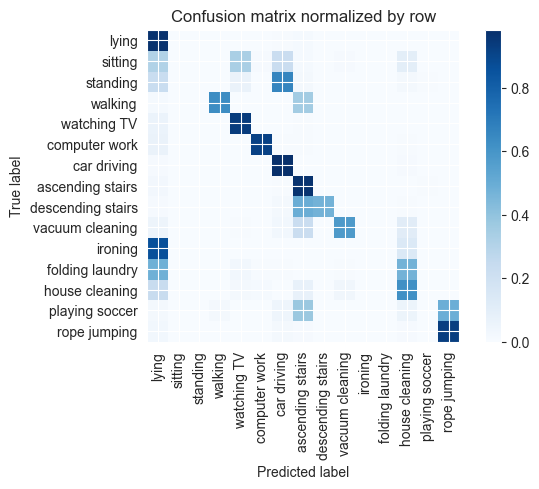

Training Epoch:   7%|▋         | 1/15 [01:02<14:38, 62.78s/it]

Overall accuracy: 0.521

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.983      0.914      0.947      0.140        618|	 lying: 0.065,	house cleaning: 0.006,	
          ironing       0.000      0.000      0.000      0.108        477|	 lying: 0.862,	house cleaning: 0.136,	watching TV: 0.002,	
          walking       0.986      0.630      0.769      0.103        454|	 ascending stairs: 0.350,	lying: 0.013,	
   house cleaning       0.497      0.621      0.552      0.086        380|	 lying: 0.234,	ascending stairs: 0.076,	
         standing       0.000      0.000      0.000      0.084        371|	 car driving: 0.658,	lying: 0.229,	watching TV: 0.065,	
          sitting       0.000      0.000      0.000      0.082        363|	 watching TV: 0.333,	lying: 0.309,	car driving: 0.226,	
            lying       0.286      0.975      0.442      0.080        355|	 ascending stairs: 0.014,	car driving: 0.006,	
  vacuum cleaning 


train: 100%|██████████| 276/276 [00:54<00:00,  5.03batch/s, loss=51.5, accuracy=0.531]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:07<00:00,  9.12batch/s, loss=50.9]


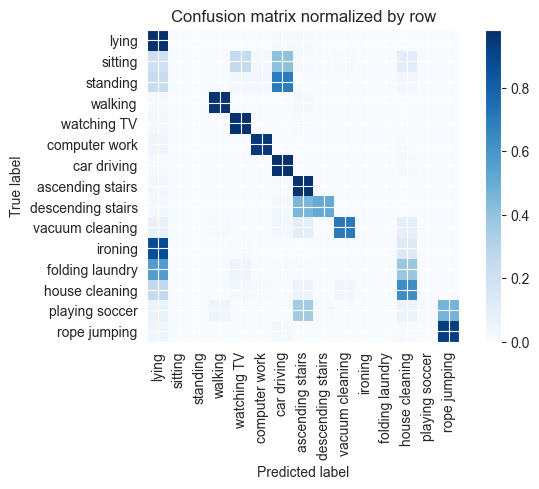

Training Epoch:  13%|█▎        | 2/15 [02:06<13:40, 63.09s/it]

Overall accuracy: 0.574

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.968      0.950      0.959      0.139        614|	 lying: 0.039,	house cleaning: 0.007,	
          ironing       0.000      0.000      0.000      0.107        474|	 lying: 0.871,	house cleaning: 0.122,	watching TV: 0.004,	
          walking       0.980      0.963      0.971      0.103        454|	 ascending stairs: 0.020,	lying: 0.011,	
   house cleaning       0.531      0.628      0.576      0.086        379|	 lying: 0.256,	ascending stairs: 0.061,	
         standing       0.000      0.000      0.000      0.084        372|	 car driving: 0.691,	lying: 0.231,	house cleaning: 0.024,	
          sitting       0.000      0.000      0.000      0.082        363|	 car driving: 0.405,	watching TV: 0.251,	lying: 0.207,	
            lying       0.293      0.978      0.451      0.081        357|	 ascending stairs: 0.011,	car driving: 0.008,	
  vacuum cleani


train: 100%|██████████| 276/276 [00:54<00:00,  5.03batch/s, loss=51.2, accuracy=0.547]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:08<00:00,  8.40batch/s, loss=49.7]


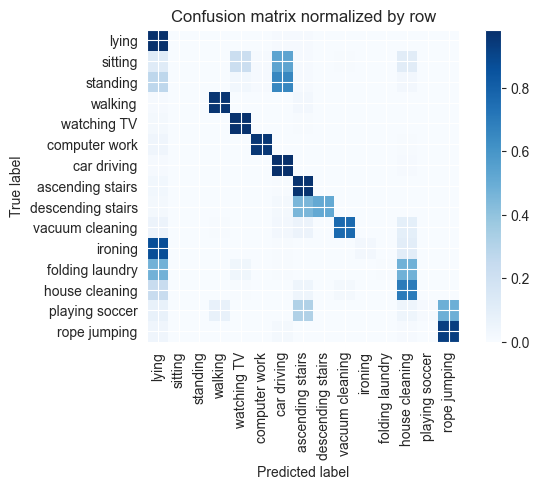

Training Epoch:  20%|██        | 3/15 [03:09<12:41, 63.45s/it]

Overall accuracy: 0.588

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.988      0.953      0.970      0.139        616|	 lying: 0.039,	house cleaning: 0.006,	
          ironing       0.917      0.023      0.045      0.108        476|	 lying: 0.870,	house cleaning: 0.103,	
          walking       0.977      0.960      0.969      0.102        451|	 ascending stairs: 0.024,	lying: 0.011,	
   house cleaning       0.545      0.698      0.613      0.086        378|	 lying: 0.233,	ascending stairs: 0.045,	
         standing       0.000      0.000      0.000      0.084        372|	 car driving: 0.653,	lying: 0.269,	watching TV: 0.027,	
          sitting       0.000      0.000      0.000      0.082        362|	 car driving: 0.533,	watching TV: 0.215,	lying: 0.119,	
            lying       0.305      0.978      0.464      0.081        358|	 ascending stairs: 0.011,	car driving: 0.008,	
  vacuum cleaning       0.961      0.7


train: 100%|██████████| 276/276 [00:55<00:00,  4.95batch/s, loss=48.1, accuracy=0.578]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:08<00:00,  8.38batch/s, loss=48.6]


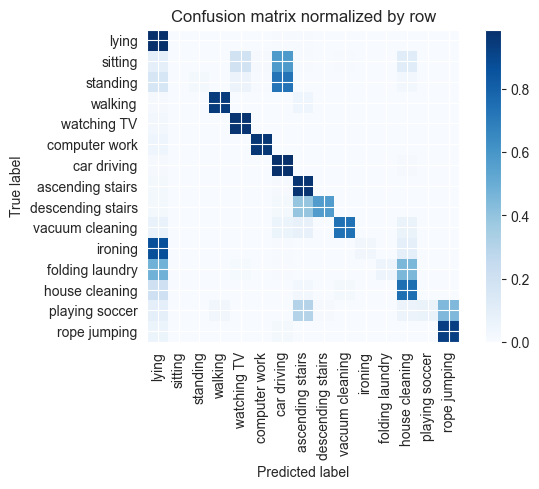

Training Epoch:  27%|██▋       | 4/15 [04:14<11:43, 63.98s/it]

Overall accuracy: 0.599

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.990      0.958      0.974      0.140        618|	 lying: 0.042,	rope jumping: 0.000,	
          ironing       1.000      0.031      0.061      0.108        478|	 lying: 0.872,	house cleaning: 0.090,	
          walking       0.993      0.945      0.968      0.103        453|	 ascending stairs: 0.040,	lying: 0.011,	
   house cleaning       0.586      0.751      0.658      0.086        378|	 lying: 0.204,	ascending stairs: 0.026,	
         standing       1.000      0.022      0.042      0.084        369|	 car driving: 0.732,	lying: 0.160,	watching TV: 0.054,	
          sitting       0.000      0.000      0.000      0.082        363|	 car driving: 0.581,	watching TV: 0.193,	house cleaning: 0.116,	
            lying       0.321      0.989      0.485      0.081        358|	 ascending stairs: 0.006,	car driving: 0.006,	
  vacuum cleaning       0.970  


train: 100%|██████████| 276/276 [00:55<00:00,  4.97batch/s, loss=46.9, accuracy=0.609]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:08<00:00,  8.48batch/s, loss=45.5]


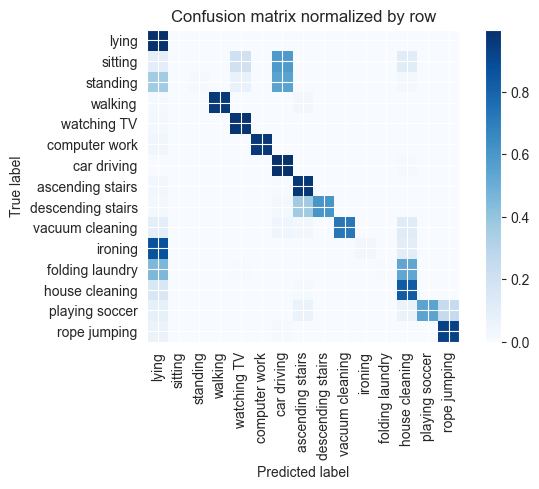

Training Epoch:  33%|███▎      | 5/15 [05:19<10:42, 64.20s/it]

Overall accuracy: 0.615

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.995      0.964      0.979      0.139        616|	 lying: 0.034,	watching TV: 0.002,	
          ironing       1.000      0.025      0.049      0.108        477|	 lying: 0.870,	house cleaning: 0.103,	
          walking       1.000      0.960      0.980      0.103        455|	 ascending stairs: 0.024,	lying: 0.013,	
   house cleaning       0.569      0.828      0.675      0.086        379|	 lying: 0.150,	ascending stairs: 0.013,	
         standing       1.000      0.008      0.016      0.084        372|	 car driving: 0.546,	lying: 0.355,	watching TV: 0.067,	
          sitting       0.000      0.000      0.000      0.082        361|	 car driving: 0.587,	watching TV: 0.197,	house cleaning: 0.116,	
            lying       0.308      0.997      0.471      0.081        358|	 house cleaning: 0.003,	rope jumping: 0.000,	
  vacuum cleaning       0.992    


train: 100%|██████████| 276/276 [00:55<00:00,  4.99batch/s, loss=45.9, accuracy=0.672]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:07<00:00,  8.66batch/s, loss=43.9]


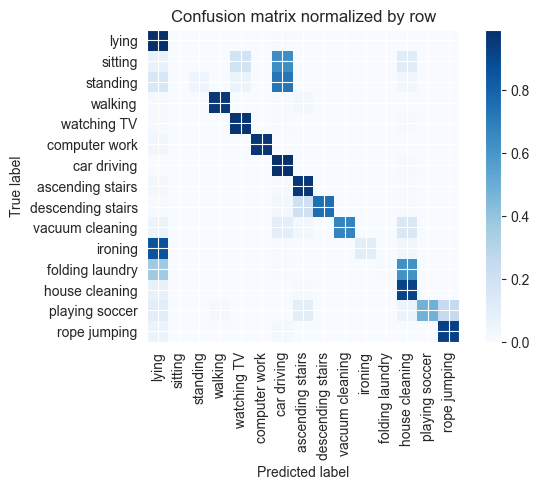

Training Epoch:  40%|████      | 6/15 [06:23<09:37, 64.21s/it]

Overall accuracy: 0.635

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.966      0.982      0.140        618|	 lying: 0.032,	watching TV: 0.002,	
          ironing       1.000      0.105      0.191      0.107        474|	 lying: 0.859,	house cleaning: 0.032,	
          walking       0.995      0.960      0.978      0.103        453|	 ascending stairs: 0.024,	lying: 0.009,	
   house cleaning       0.596      0.915      0.722      0.086        378|	 lying: 0.071,	ascending stairs: 0.008,	
         standing       1.000      0.041      0.078      0.084        370|	 car driving: 0.722,	lying: 0.151,	watching TV: 0.054,	
          sitting       1.000      0.003      0.005      0.082        364|	 car driving: 0.632,	watching TV: 0.184,	house cleaning: 0.113,	
            lying       0.354      0.992      0.522      0.081        356|	 car driving: 0.006,	house cleaning: 0.003,	
  vacuum cleaning       0.996     


train: 100%|██████████| 276/276 [00:55<00:00,  4.95batch/s, loss=44.1, accuracy=0.688]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:07<00:00,  8.73batch/s, loss=43.3]


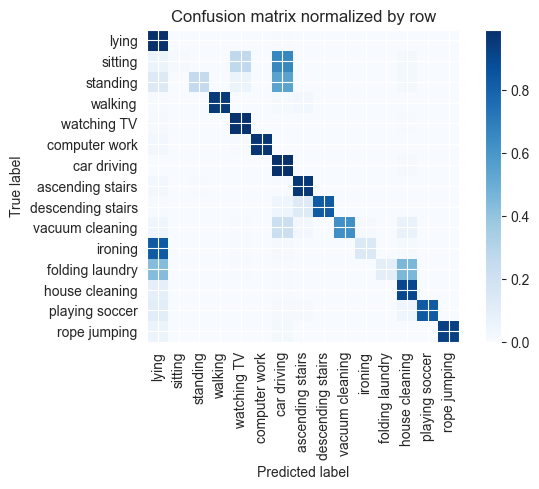

Training Epoch:  47%|████▋     | 7/15 [07:28<08:34, 64.35s/it]

Overall accuracy: 0.665

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.966      0.983      0.140        617|	 lying: 0.026,	watching TV: 0.005,	
          ironing       0.943      0.138      0.241      0.108        477|	 lying: 0.832,	house cleaning: 0.015,	
          walking       1.000      0.956      0.977      0.102        451|	 ascending stairs: 0.024,	car driving: 0.013,	
   house cleaning       0.726      0.902      0.804      0.086        378|	 lying: 0.087,	car driving: 0.005,	
         standing       0.979      0.250      0.398      0.084        372|	 car driving: 0.543,	lying: 0.126,	
          sitting       1.000      0.008      0.016      0.082        362|	 car driving: 0.655,	watching TV: 0.262,	lying: 0.052,	
            lying       0.362      0.992      0.530      0.081        358|	 car driving: 0.006,	house cleaning: 0.003,	
  vacuum cleaning       1.000      0.627      0.771      0.079


train: 100%|██████████| 276/276 [00:55<00:00,  4.96batch/s, loss=42.8, accuracy=0.734]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:08<00:00,  8.33batch/s, loss=42.2]


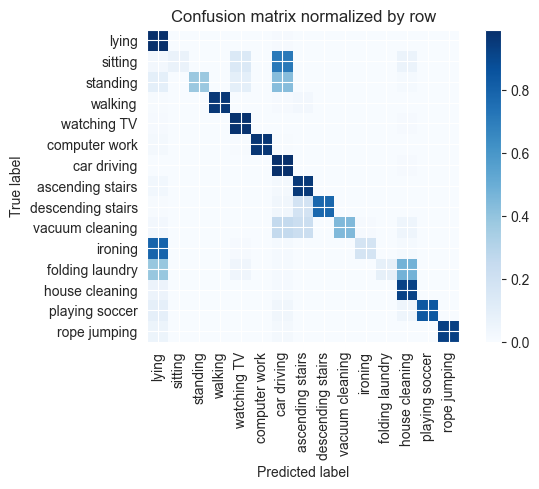

Training Epoch:  53%|█████▎    | 8/15 [08:32<07:31, 64.48s/it]

Overall accuracy: 0.669

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.968      0.983      0.140        617|	 lying: 0.023,	car driving: 0.005,	
          ironing       0.965      0.172      0.292      0.108        476|	 lying: 0.792,	house cleaning: 0.013,	
          walking       1.000      0.960      0.980      0.102        452|	 ascending stairs: 0.027,	car driving: 0.009,	
   house cleaning       0.721      0.921      0.809      0.086        379|	 lying: 0.058,	car driving: 0.013,	
         standing       0.993      0.376      0.546      0.084        372|	 car driving: 0.427,	watching TV: 0.091,	
          sitting       1.000      0.063      0.119      0.082        363|	 car driving: 0.711,	watching TV: 0.138,	
            lying       0.391      0.992      0.560      0.081        358|	 car driving: 0.008,	rope jumping: 0.000,	
  vacuum cleaning       1.000      0.443      0.614      0.079        35


train: 100%|██████████| 276/276 [00:54<00:00,  5.02batch/s, loss=42, accuracy=0.672]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:07<00:00,  8.71batch/s, loss=40.9]


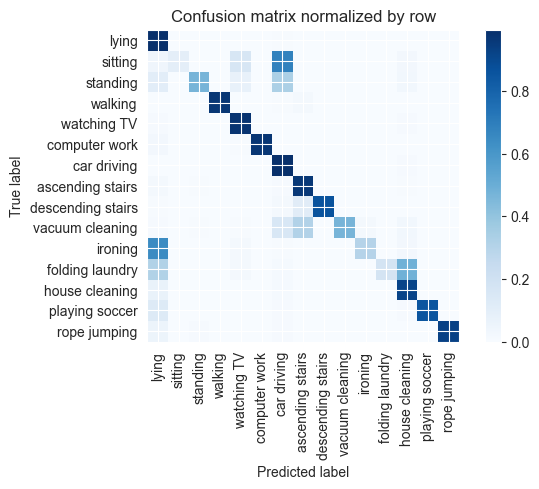

Training Epoch:  60%|██████    | 9/15 [09:36<06:25, 64.27s/it]

Overall accuracy: 0.703

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.969      0.984      0.140        617|	 lying: 0.024,	watching TV: 0.005,	
          ironing       0.960      0.301      0.458      0.108        475|	 lying: 0.646,	house cleaning: 0.025,	
          walking       1.000      0.967      0.983      0.103        454|	 ascending stairs: 0.022,	car driving: 0.007,	
   house cleaning       0.727      0.915      0.810      0.086        378|	 lying: 0.066,	car driving: 0.013,	
         standing       0.978      0.469      0.634      0.084        373|	 car driving: 0.327,	lying: 0.102,	
          sitting       1.000      0.094      0.172      0.082        362|	 car driving: 0.677,	watching TV: 0.160,	
            lying       0.425      0.994      0.595      0.081        358|	 car driving: 0.006,	rope jumping: 0.000,	
  vacuum cleaning       1.000      0.467      0.637      0.079        351|	 as


train: 100%|██████████| 276/276 [00:55<00:00,  4.94batch/s, loss=40.4, accuracy=0.781]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:07<00:00,  9.09batch/s, loss=40.7]


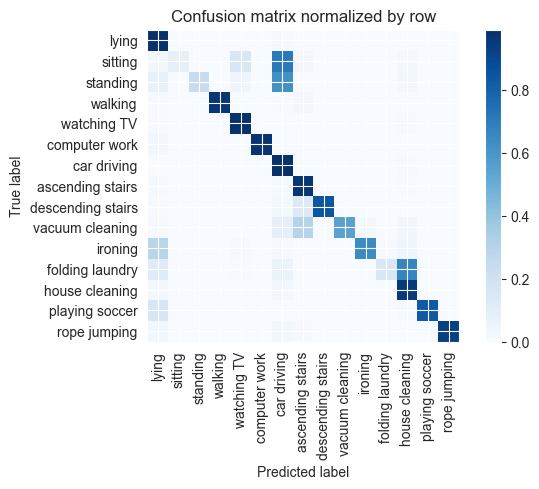

Training Epoch:  67%|██████▋   | 10/15 [10:41<05:21, 64.32s/it]

Overall accuracy: 0.726

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.969      0.984      0.140        617|	 lying: 0.028,	car driving: 0.003,	
          ironing       0.975      0.643      0.775      0.108        476|	 lying: 0.290,	house cleaning: 0.044,	
          walking       1.000      0.965      0.982      0.102        452|	 ascending stairs: 0.027,	car driving: 0.004,	
   house cleaning       0.686      0.953      0.797      0.086        380|	 car driving: 0.026,	lying: 0.016,	
         standing       0.989      0.233      0.377      0.084        373|	 car driving: 0.622,	lying: 0.072,	
          sitting       1.000      0.080      0.148      0.082        364|	 car driving: 0.706,	watching TV: 0.148,	
            lying       0.590      0.992      0.739      0.080        355|	 car driving: 0.008,	rope jumping: 0.000,	
  vacuum cleaning       1.000      0.547      0.707      0.079        351|	 as


train: 100%|██████████| 276/276 [00:56<00:00,  4.93batch/s, loss=39.7, accuracy=0.719]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:07<00:00,  9.26batch/s, loss=38.6]


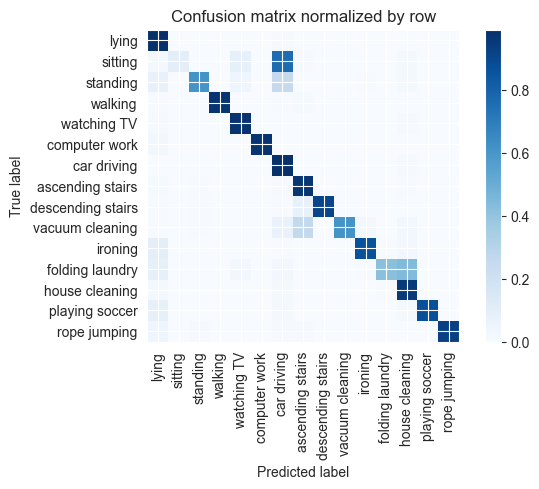

Training Epoch:  73%|███████▎  | 11/15 [11:45<04:17, 64.32s/it]

Overall accuracy: 0.803

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.971      0.985      0.140        618|	 lying: 0.026,	car driving: 0.003,	
          ironing       0.969      0.863      0.913      0.108        475|	 lying: 0.095,	house cleaning: 0.029,	
          walking       0.998      0.976      0.987      0.103        454|	 ascending stairs: 0.015,	car driving: 0.004,	
   house cleaning       0.753      0.955      0.842      0.086        380|	 car driving: 0.018,	lying: 0.018,	
         standing       0.974      0.612      0.752      0.084        371|	 car driving: 0.251,	lying: 0.070,	
          sitting       1.000      0.096      0.175      0.082        364|	 car driving: 0.761,	watching TV: 0.085,	
            lying       0.719      0.992      0.834      0.081        356|	 car driving: 0.008,	rope jumping: 0.000,	
  vacuum cleaning       1.000      0.610      0.758      0.079        349|	 as


train: 100%|██████████| 276/276 [00:55<00:00,  4.96batch/s, loss=37.8, accuracy=0.891]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:08<00:00,  8.42batch/s, loss=36.7]


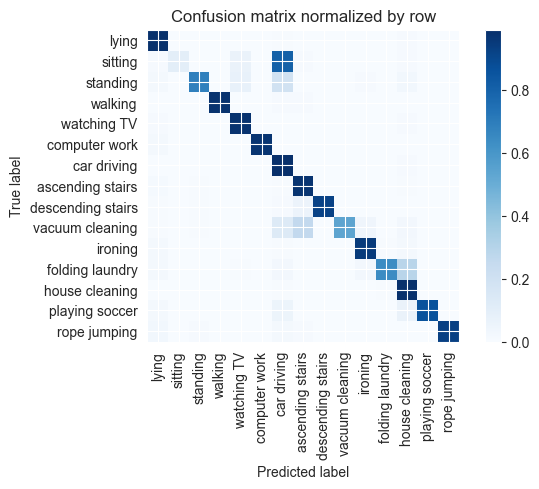

Training Epoch:  80%|████████  | 12/15 [12:50<03:13, 64.43s/it]

Overall accuracy: 0.824

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.971      0.985      0.139        616|	 lying: 0.018,	house cleaning: 0.003,	
          ironing       0.950      0.946      0.948      0.108        478|	 lying: 0.023,	house cleaning: 0.019,	
          walking       1.000      0.978      0.989      0.103        453|	 ascending stairs: 0.011,	car driving: 0.009,	
   house cleaning       0.793      0.984      0.878      0.086        378|	 folding laundry: 0.005,	car driving: 0.005,	
         standing       0.977      0.682      0.803      0.084        371|	 car driving: 0.189,	watching TV: 0.073,	
          sitting       1.000      0.099      0.180      0.082        364|	 car driving: 0.805,	watching TV: 0.063,	
            lying       0.880      0.986      0.930      0.081        358|	 house cleaning: 0.008,	car driving: 0.006,	
  vacuum cleaning       1.000      0.537      0.699      


train: 100%|██████████| 276/276 [00:57<00:00,  4.83batch/s, loss=36.5, accuracy=0.781]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:08<00:00,  8.55batch/s, loss=33.9]


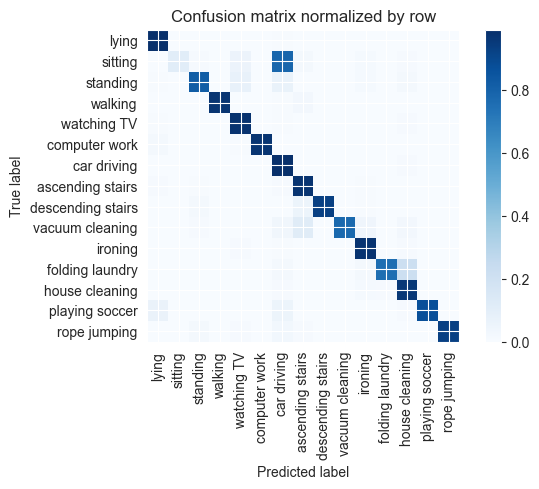

Training Epoch:  87%|████████▋ | 13/15 [13:56<02:09, 64.92s/it]

Overall accuracy: 0.860

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.971      0.985      0.139        615|	 lying: 0.020,	watching TV: 0.005,	
          ironing       0.932      0.973      0.952      0.108        476|	 house cleaning: 0.011,	watching TV: 0.011,	
          walking       1.000      0.969      0.984      0.102        452|	 ascending stairs: 0.024,	car driving: 0.007,	
   house cleaning       0.846      0.960      0.899      0.085        377|	 ironing: 0.013,	car driving: 0.011,	
         standing       0.956      0.820      0.883      0.084        372|	 watching TV: 0.075,	car driving: 0.067,	
          sitting       1.000      0.107      0.194      0.082        363|	 car driving: 0.782,	watching TV: 0.055,	
            lying       0.929      0.989      0.958      0.081        358|	 car driving: 0.006,	house cleaning: 0.003,	
  vacuum cleaning       1.000      0.774      0.873      0.079


train: 100%|██████████| 276/276 [00:56<00:00,  4.92batch/s, loss=35.8, accuracy=0.828]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:07<00:00,  8.74batch/s, loss=36.2]


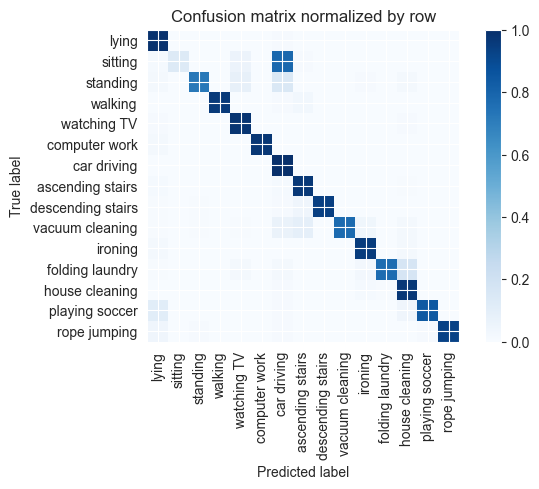

Training Epoch:  93%|█████████▎| 14/15 [15:01<01:04, 64.92s/it]

Overall accuracy: 0.851

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.971      0.985      0.139        616|	 lying: 0.021,	watching TV: 0.003,	
          ironing       0.944      0.950      0.947      0.108        476|	 house cleaning: 0.023,	lying: 0.023,	
          walking       1.000      0.958      0.979      0.103        453|	 ascending stairs: 0.031,	car driving: 0.009,	
   house cleaning       0.852      0.968      0.906      0.086        379|	 ironing: 0.013,	car driving: 0.008,	
         standing       0.982      0.721      0.832      0.084        373|	 car driving: 0.147,	watching TV: 0.080,	
          sitting       1.000      0.129      0.229      0.082        364|	 car driving: 0.783,	watching TV: 0.058,	
            lying       0.852      0.992      0.916      0.080        354|	 car driving: 0.008,	rope jumping: 0.000,	
  vacuum cleaning       1.000      0.772      0.871      0.079        


train: 100%|██████████| 276/276 [00:56<00:00,  4.92batch/s, loss=33.9, accuracy=0.859]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:08<00:00,  8.27batch/s, loss=33.3]


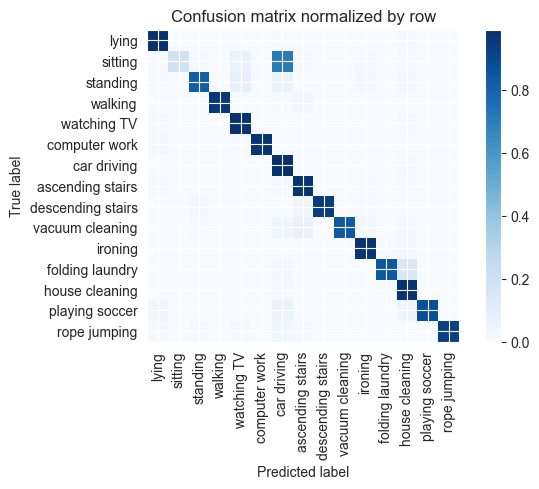

Overall accuracy: 0.875

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.971      0.985      0.139        616|	 lying: 0.018,	watching TV: 0.006,	
          ironing       0.951      0.975      0.963      0.108        476|	 house cleaning: 0.017,	folding laundry: 0.004,	
          walking       1.000      0.960      0.980      0.102        452|	 ascending stairs: 0.029,	car driving: 0.007,	
   house cleaning       0.858      0.979      0.915      0.086        378|	 car driving: 0.011,	folding laundry: 0.005,	
         standing       0.965      0.815      0.883      0.084        372|	 watching TV: 0.078,	car driving: 0.062,	
          sitting       1.000      0.187      0.315      0.082        364|	 car driving: 0.706,	watching TV: 0.063,	
            lying       0.936      0.983      0.959      0.081        356|	 house cleaning: 0.008,	car driving: 0.006,	
  vacuum cleaning       1.000      0.831      0.90

unseen: 100%|██████████| 68/68 [00:07<00:00,  9.08batch/s, loss=45.3]


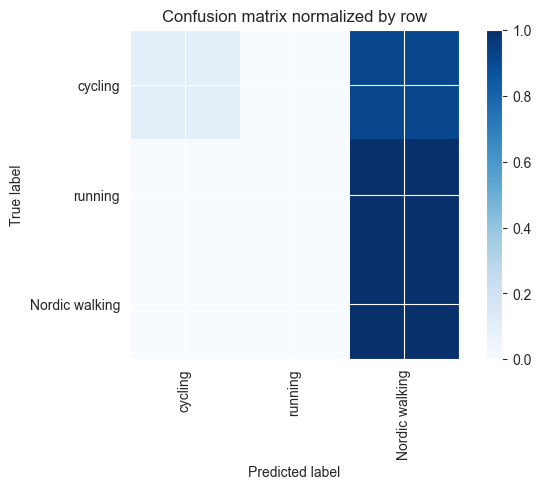

Overall accuracy: 0.453

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.433      1.000      0.605      0.419       1822|	 running: 0.000,	cycling: 0.000,	
       cycling       0.993      0.093      0.170      0.365       1590|	 Nordic walking: 0.907,	running: 0.000,	
       running       0.000      0.000      0.000      0.216        940|	 Nordic walking: 0.999,	cycling: 0.001,	

----------------------------------------------------------------------------------------------------
   avg / total       0.544      0.453      0.315        1.0       4352|	      

{'accuracy': 0.45266544117647056, 'precision': 0.4755961572137937, 'recall': 0.36436058700209645, 'f1': 0.2583420146552485}
================ Fold-4 ================
Unseen Classes : ['ironing', 'car driving', 'folding laundry']
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, '

Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([15, 2048])



train: 100%|██████████| 283/283 [00:56<00:00,  5.02batch/s, loss=54.2, accuracy=0.359]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:07<00:00,  8.99batch/s, loss=54.3]


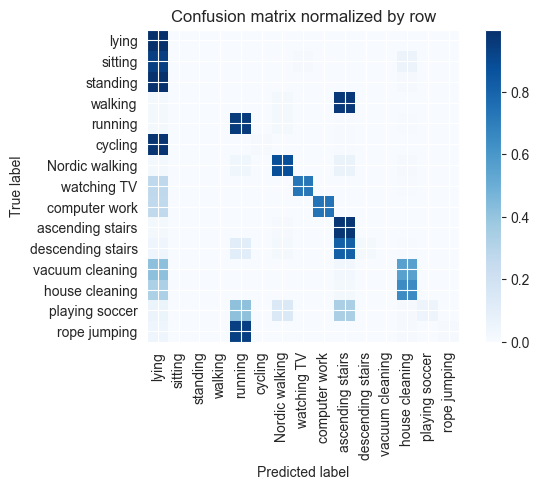

Training Epoch:   7%|▋         | 1/15 [01:05<15:10, 65.03s/it]

Overall accuracy: 0.425

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.739      0.850      0.136        609|	 lying: 0.261,	rope jumping: 0.000,	
          walking       0.000      0.000      0.000      0.101        452|	 ascending stairs: 0.965,	Nordic walking: 0.018,	lying: 0.018,	
            lying       0.197      0.997      0.329      0.082        368|	 house cleaning: 0.003,	rope jumping: 0.000,	
   Nordic walking       0.910      0.877      0.893      0.082        367|	 ascending stairs: 0.063,	running: 0.035,	
          sitting       0.000      0.000      0.000      0.081        363|	 lying: 0.937,	house cleaning: 0.055,	watching TV: 0.008,	
   house cleaning       0.514      0.645      0.572      0.081        361|	 lying: 0.330,	ascending stairs: 0.022,	
         standing       0.000      0.000      0.000      0.077        347|	 lying: 0.988,	house cleaning: 0.012,	rope jumping: 0.000,	
  vacuu


train: 100%|██████████| 283/283 [00:56<00:00,  4.97batch/s, loss=52.2, accuracy=0.422]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:07<00:00,  8.82batch/s, loss=50.5]


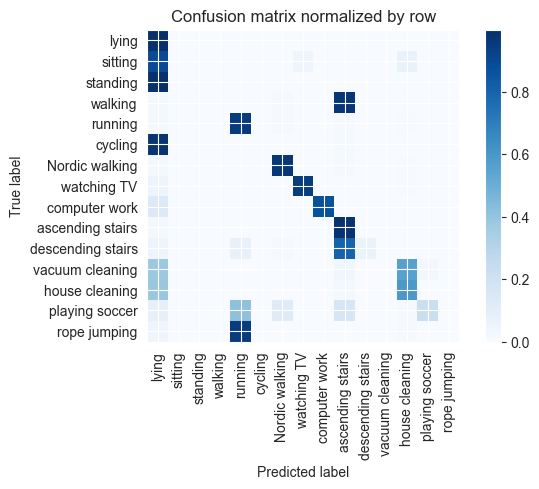

Training Epoch:  13%|█▎        | 2/15 [02:10<14:11, 65.48s/it]

Overall accuracy: 0.462

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.866      0.928      0.137        614|	 lying: 0.134,	rope jumping: 0.000,	
          walking       0.000      0.000      0.000      0.099        442|	 ascending stairs: 0.973,	lying: 0.018,	Nordic walking: 0.009,	
            lying       0.211      0.997      0.349      0.082        369|	 house cleaning: 0.003,	rope jumping: 0.000,	
          sitting       0.000      0.000      0.000      0.082        368|	 lying: 0.891,	house cleaning: 0.068,	watching TV: 0.041,	
   Nordic walking       0.944      0.967      0.955      0.082        366|	 lying: 0.016,	ascending stairs: 0.011,	
   house cleaning       0.492      0.595      0.539      0.080        358|	 lying: 0.385,	ascending stairs: 0.020,	
         standing       0.000      0.000      0.000      0.077        344|	 lying: 0.997,	house cleaning: 0.003,	rope jumping: 0.000,	
  vacuum 


train: 100%|██████████| 283/283 [00:57<00:00,  4.94batch/s, loss=49.5, accuracy=0.453]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:07<00:00,  9.04batch/s, loss=49.7]


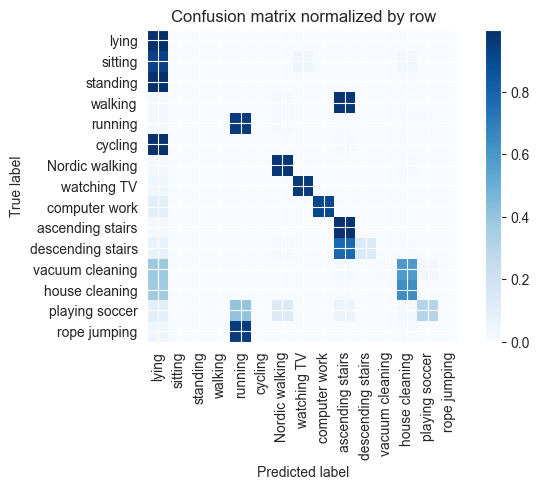

Training Epoch:  20%|██        | 3/15 [03:17<13:09, 65.80s/it]

Overall accuracy: 0.475

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.906      0.950      0.137        614|	 lying: 0.094,	rope jumping: 0.000,	
          walking       0.000      0.000      0.000      0.100        450|	 ascending stairs: 0.971,	lying: 0.020,	Nordic walking: 0.009,	
   Nordic walking       0.944      0.970      0.957      0.082        368|	 lying: 0.019,	house cleaning: 0.008,	
            lying       0.213      0.997      0.351      0.082        367|	 house cleaning: 0.003,	rope jumping: 0.000,	
          sitting       0.000      0.000      0.000      0.082        366|	 lying: 0.929,	watching TV: 0.041,	house cleaning: 0.030,	
   house cleaning       0.508      0.636      0.565      0.079        354|	 lying: 0.359,	ascending stairs: 0.006,	
         standing       0.000      0.000      0.000      0.076        341|	 lying: 0.994,	house cleaning: 0.006,	rope jumping: 0.000,	
  vacuum cl


train: 100%|██████████| 283/283 [00:57<00:00,  4.94batch/s, loss=49.7, accuracy=0.484]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:07<00:00,  9.03batch/s, loss=47.1]


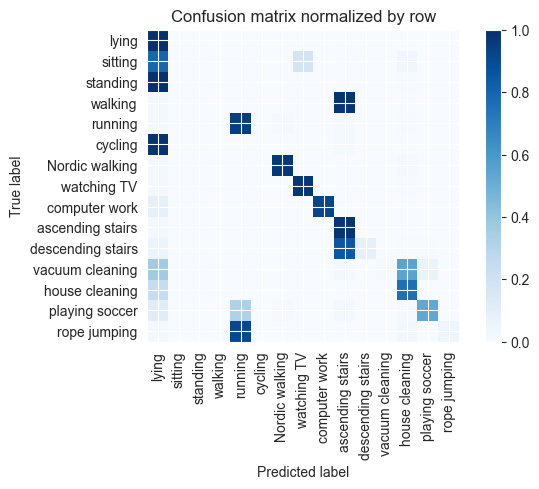

Training Epoch:  27%|██▋       | 4/15 [04:22<12:04, 65.84s/it]

Overall accuracy: 0.491

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.919      0.958      0.136        608|	 lying: 0.081,	rope jumping: 0.000,	
          walking       1.000      0.002      0.004      0.100        448|	 ascending stairs: 0.978,	lying: 0.020,	
          sitting       0.000      0.000      0.000      0.082        367|	 lying: 0.790,	watching TV: 0.177,	house cleaning: 0.033,	
            lying       0.226      1.000      0.369      0.082        366|	 rope jumping: 0.000,	playing soccer: 0.000,	
   Nordic walking       0.992      0.970      0.981      0.081        363|	 lying: 0.019,	house cleaning: 0.008,	
   house cleaning       0.570      0.756      0.650      0.081        361|	 lying: 0.241,	ascending stairs: 0.003,	
         standing       0.000      0.000      0.000      0.077        345|	 lying: 0.994,	house cleaning: 0.006,	rope jumping: 0.000,	
  vacuum cleaning       1.000     


train: 100%|██████████| 283/283 [00:57<00:00,  4.89batch/s, loss=46.3, accuracy=0.562]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:07<00:00,  8.76batch/s, loss=48.8]


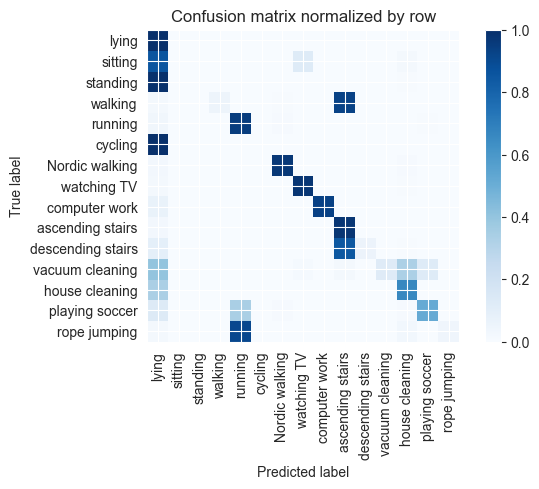

Training Epoch:  33%|███▎      | 5/15 [05:29<11:01, 66.17s/it]

Overall accuracy: 0.494

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.931      0.964      0.136        610|	 lying: 0.069,	rope jumping: 0.000,	
          walking       1.000      0.049      0.093      0.101        452|	 ascending stairs: 0.927,	lying: 0.020,	
          sitting       0.000      0.000      0.000      0.082        369|	 lying: 0.859,	watching TV: 0.122,	house cleaning: 0.019,	
   Nordic walking       0.986      0.967      0.976      0.081        365|	 lying: 0.025,	house cleaning: 0.008,	
            lying       0.213      1.000      0.351      0.081        361|	 rope jumping: 0.000,	playing soccer: 0.000,	
   house cleaning       0.647      0.663      0.655      0.079        356|	 lying: 0.334,	ascending stairs: 0.003,	
         standing       0.000      0.000      0.000      0.077        344|	 lying: 0.994,	house cleaning: 0.006,	rope jumping: 0.000,	
  vacuum cleaning       1.000     


train: 100%|██████████| 283/283 [00:57<00:00,  4.91batch/s, loss=44.7, accuracy=0.562]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:07<00:00,  9.05batch/s, loss=43.6]


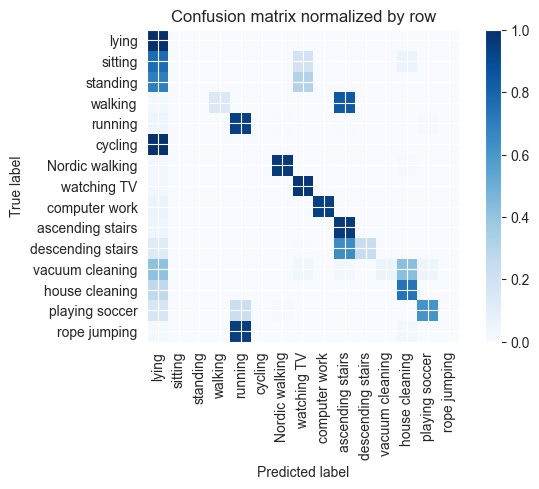

Training Epoch:  40%|████      | 6/15 [06:35<09:55, 66.19s/it]

Overall accuracy: 0.515

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.938      0.968      0.137        615|	 lying: 0.062,	rope jumping: 0.000,	
          walking       1.000      0.139      0.245      0.101        452|	 ascending stairs: 0.841,	lying: 0.018,	
   Nordic walking       0.992      0.962      0.976      0.082        366|	 lying: 0.030,	house cleaning: 0.008,	
            lying       0.236      0.995      0.381      0.081        365|	 house cleaning: 0.003,	watching TV: 0.003,	
          sitting       0.000      0.000      0.000      0.081        364|	 lying: 0.766,	watching TV: 0.181,	house cleaning: 0.052,	
   house cleaning       0.612      0.738      0.669      0.079        355|	 lying: 0.262,	rope jumping: 0.000,	
         standing       0.000      0.000      0.000      0.077        344|	 lying: 0.695,	watching TV: 0.305,	rope jumping: 0.000,	
  vacuum cleaning       1.000      0.060  


train: 100%|██████████| 283/283 [00:57<00:00,  4.90batch/s, loss=44.1, accuracy=0.625]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:07<00:00,  8.84batch/s, loss=43.5]


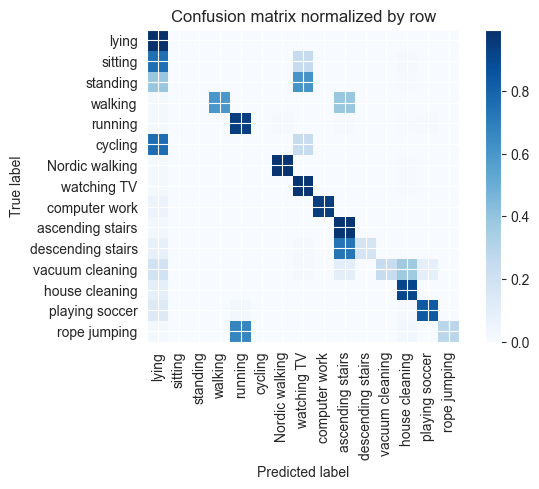

Training Epoch:  47%|████▋     | 7/15 [07:42<08:50, 66.31s/it]

Overall accuracy: 0.599

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.941      0.970      0.136        611|	 lying: 0.057,	house cleaning: 0.002,	
          walking       1.000      0.597      0.748      0.100        449|	 ascending stairs: 0.385,	lying: 0.016,	
            lying       0.304      0.995      0.466      0.082        367|	 house cleaning: 0.003,	watching TV: 0.003,	
   Nordic walking       0.994      0.973      0.983      0.081        364|	 lying: 0.022,	house cleaning: 0.005,	
          sitting       0.000      0.000      0.000      0.081        364|	 lying: 0.750,	watching TV: 0.242,	house cleaning: 0.008,	
   house cleaning       0.703      0.908      0.792      0.080        359|	 lying: 0.092,	rope jumping: 0.000,	
         standing       0.000      0.000      0.000      0.077        346|	 watching TV: 0.610,	lying: 0.384,	house cleaning: 0.006,	
  vacuum cleaning       1.000      0.2


train: 100%|██████████| 283/283 [00:57<00:00,  4.91batch/s, loss=44, accuracy=0.562]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:07<00:00,  8.81batch/s, loss=43.9]


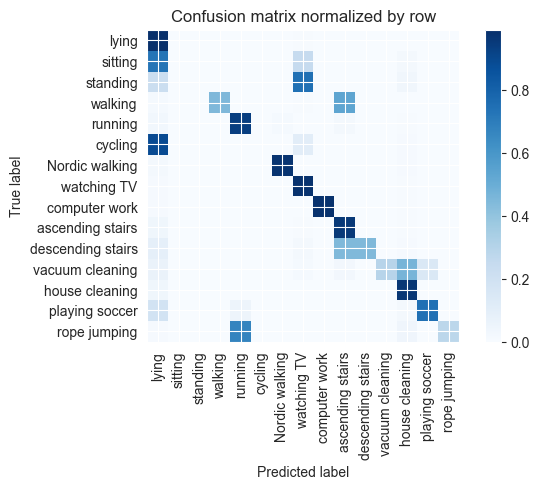

Training Epoch:  53%|█████▎    | 8/15 [08:48<07:44, 66.39s/it]

Overall accuracy: 0.606

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.984      0.991      0.136        611|	 lying: 0.011,	house cleaning: 0.005,	
          walking       1.000      0.446      0.617      0.100        448|	 ascending stairs: 0.533,	lying: 0.013,	
            lying       0.334      0.992      0.500      0.082        367|	 watching TV: 0.005,	house cleaning: 0.003,	
   Nordic walking       0.992      0.975      0.983      0.081        365|	 lying: 0.016,	house cleaning: 0.008,	
          sitting       0.000      0.000      0.000      0.081        364|	 lying: 0.731,	watching TV: 0.247,	house cleaning: 0.022,	
   house cleaning       0.639      0.961      0.767      0.081        362|	 lying: 0.039,	rope jumping: 0.000,	
         standing       0.000      0.000      0.000      0.077        344|	 watching TV: 0.747,	lying: 0.218,	house cleaning: 0.032,	
  vacuum cleaning       1.000      0.2


train: 100%|██████████| 283/283 [00:57<00:00,  4.90batch/s, loss=41.9, accuracy=0.719]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:07<00:00,  8.95batch/s, loss=41.2]


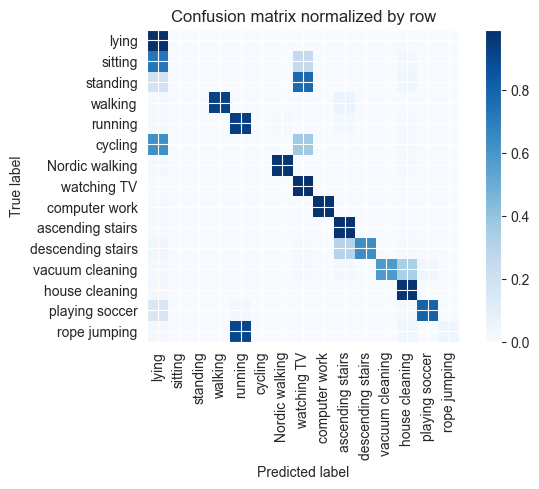

Training Epoch:  60%|██████    | 9/15 [09:55<06:38, 66.42s/it]

Overall accuracy: 0.682

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.982      0.991      0.137        612|	 lying: 0.015,	house cleaning: 0.003,	
          walking       1.000      0.922      0.960      0.100        450|	 ascending stairs: 0.060,	lying: 0.009,	
   Nordic walking       0.992      0.975      0.983      0.082        366|	 lying: 0.016,	house cleaning: 0.008,	
          sitting       0.000      0.000      0.000      0.082        366|	 lying: 0.727,	watching TV: 0.249,	house cleaning: 0.025,	
            lying       0.379      0.992      0.548      0.081        365|	 house cleaning: 0.005,	watching TV: 0.003,	
   house cleaning       0.694      0.969      0.809      0.080        360|	 lying: 0.031,	rope jumping: 0.000,	
         standing       0.000      0.000      0.000      0.076        342|	 watching TV: 0.769,	lying: 0.193,	house cleaning: 0.038,	
  vacuum cleaning       1.000      0.5


train: 100%|██████████| 283/283 [00:57<00:00,  4.89batch/s, loss=41.1, accuracy=0.688]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:08<00:00,  8.64batch/s, loss=41.2]


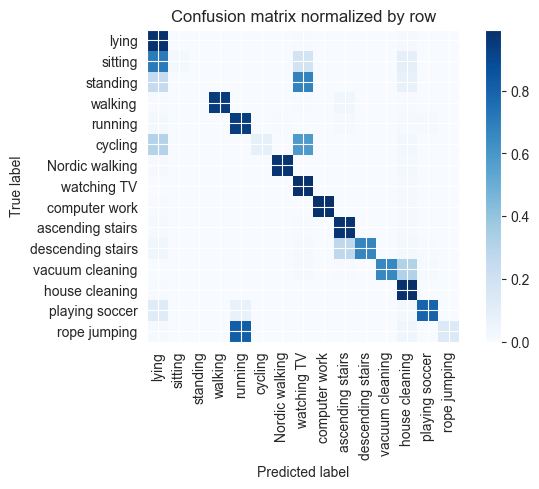

Training Epoch:  67%|██████▋   | 10/15 [11:02<05:32, 66.58s/it]

Overall accuracy: 0.702

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.987      0.993      0.137        613|	 house cleaning: 0.008,	lying: 0.005,	
          walking       1.000      0.944      0.971      0.100        448|	 ascending stairs: 0.036,	house cleaning: 0.007,	
            lying       0.434      0.984      0.602      0.082        369|	 house cleaning: 0.011,	watching TV: 0.005,	
          sitting       1.000      0.016      0.032      0.082        366|	 lying: 0.705,	watching TV: 0.186,	house cleaning: 0.093,	
   Nordic walking       0.994      0.975      0.985      0.081        364|	 house cleaning: 0.016,	lying: 0.008,	
   house cleaning       0.633      0.994      0.774      0.079        356|	 lying: 0.006,	rope jumping: 0.000,	
         standing       0.000      0.000      0.000      0.077        343|	 watching TV: 0.679,	lying: 0.245,	house cleaning: 0.073,	
  vacuum cleaning       1.000


train: 100%|██████████| 283/283 [00:58<00:00,  4.87batch/s, loss=39.4, accuracy=0.75]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:07<00:00,  8.89batch/s, loss=38.9]


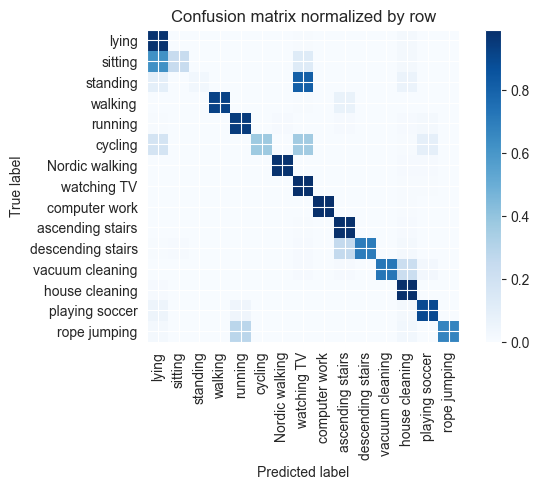

Training Epoch:  73%|███████▎  | 11/15 [12:09<04:26, 66.68s/it]

Overall accuracy: 0.760

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.992      0.995      0.137        615|	 house cleaning: 0.005,	lying: 0.003,	
          walking       1.000      0.920      0.958      0.100        448|	 ascending stairs: 0.067,	watching TV: 0.007,	
   Nordic walking       0.989      0.978      0.984      0.082        367|	 house cleaning: 0.011,	playing soccer: 0.008,	
            lying       0.520      0.978      0.679      0.082        366|	 house cleaning: 0.016,	watching TV: 0.005,	
          sitting       0.967      0.238      0.382      0.081        365|	 lying: 0.622,	watching TV: 0.121,	
   house cleaning       0.730      0.989      0.840      0.080        359|	 lying: 0.011,	rope jumping: 0.000,	
         standing       1.000      0.029      0.056      0.077        345|	 watching TV: 0.812,	lying: 0.093,	house cleaning: 0.061,	
  vacuum cleaning       1.000      0.723      


train: 100%|██████████| 283/283 [00:57<00:00,  4.88batch/s, loss=38.5, accuracy=0.922]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:07<00:00,  8.85batch/s, loss=37]


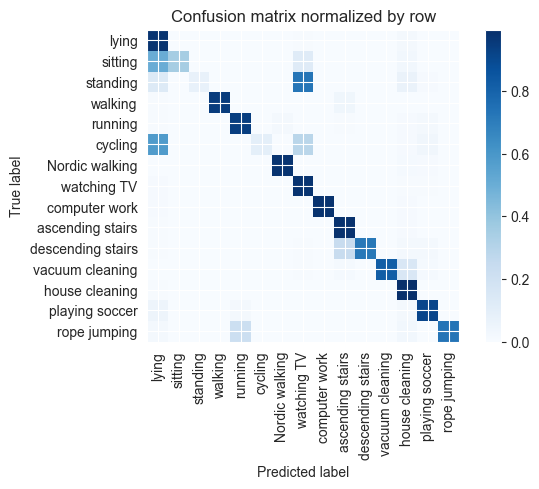

Training Epoch:  80%|████████  | 12/15 [13:15<03:20, 66.67s/it]

Overall accuracy: 0.763

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.982      0.991      0.137        615|	 house cleaning: 0.010,	lying: 0.008,	
          walking       1.000      0.944      0.971      0.100        450|	 ascending stairs: 0.038,	lying: 0.007,	
   Nordic walking       0.989      0.975      0.982      0.082        367|	 house cleaning: 0.014,	playing soccer: 0.008,	
          sitting       1.000      0.348      0.516      0.081        365|	 lying: 0.504,	watching TV: 0.118,	
            lying       0.454      0.975      0.619      0.081        365|	 house cleaning: 0.019,	watching TV: 0.005,	
   house cleaning       0.753      0.994      0.857      0.080        358|	 lying: 0.006,	rope jumping: 0.000,	
         standing       1.000      0.073      0.136      0.077        344|	 watching TV: 0.730,	lying: 0.125,	
  vacuum cleaning       1.000      0.817      0.899      0.074        333|	


train: 100%|██████████| 283/283 [00:58<00:00,  4.84batch/s, loss=37.6, accuracy=0.781]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:07<00:00,  8.94batch/s, loss=38.6]


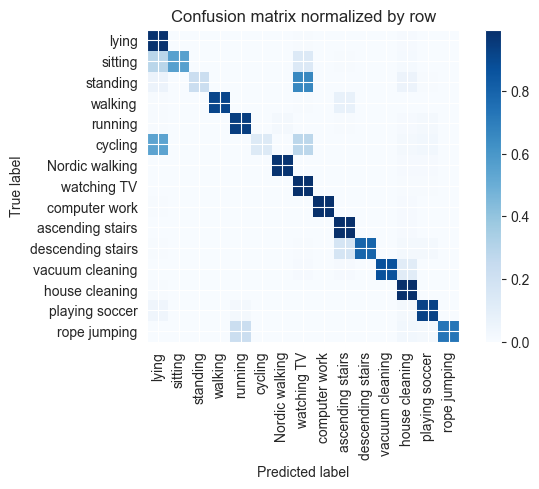

Training Epoch:  87%|████████▋ | 13/15 [14:23<02:13, 66.81s/it]

Overall accuracy: 0.800

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.987      0.993      0.136        610|	 house cleaning: 0.008,	lying: 0.005,	
          walking       1.000      0.911      0.954      0.101        451|	 ascending stairs: 0.073,	watching TV: 0.004,	
   Nordic walking       0.989      0.978      0.984      0.082        369|	 playing soccer: 0.011,	house cleaning: 0.008,	
            lying       0.544      0.984      0.700      0.082        368|	 house cleaning: 0.011,	watching TV: 0.005,	
          sitting       1.000      0.557      0.716      0.082        366|	 lying: 0.284,	watching TV: 0.134,	
   house cleaning       0.793      0.994      0.883      0.080        359|	 lying: 0.006,	rope jumping: 0.000,	
         standing       1.000      0.225      0.368      0.076        342|	 watching TV: 0.658,	house cleaning: 0.056,	
  vacuum cleaning       0.997      0.869      0.928      0.0


train: 100%|██████████| 283/283 [01:00<00:00,  4.72batch/s, loss=35.4, accuracy=0.781]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:09<00:00,  7.74batch/s, loss=33.7]


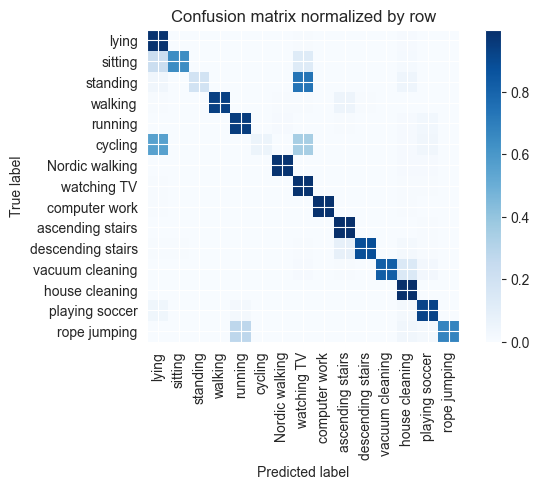

Training Epoch:  93%|█████████▎| 14/15 [15:33<01:07, 67.79s/it]

Overall accuracy: 0.800

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.989      0.994      0.136        609|	 house cleaning: 0.007,	lying: 0.005,	
          walking       1.000      0.931      0.964      0.101        452|	 ascending stairs: 0.049,	descending stairs: 0.004,	
            lying       0.567      0.984      0.719      0.082        367|	 house cleaning: 0.011,	watching TV: 0.005,	
   Nordic walking       0.986      0.978      0.982      0.082        366|	 playing soccer: 0.011,	house cleaning: 0.008,	
          sitting       0.996      0.639      0.779      0.081        363|	 lying: 0.220,	watching TV: 0.124,	
   house cleaning       0.791      0.997      0.882      0.080        357|	 lying: 0.003,	rope jumping: 0.000,	
         standing       1.000      0.186      0.313      0.077        345|	 watching TV: 0.733,	house cleaning: 0.046,	
  vacuum cleaning       1.000      0.819      0.900   


train: 100%|██████████| 283/283 [01:00<00:00,  4.68batch/s, loss=35.2, accuracy=0.797]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:08<00:00,  8.60batch/s, loss=30.5]


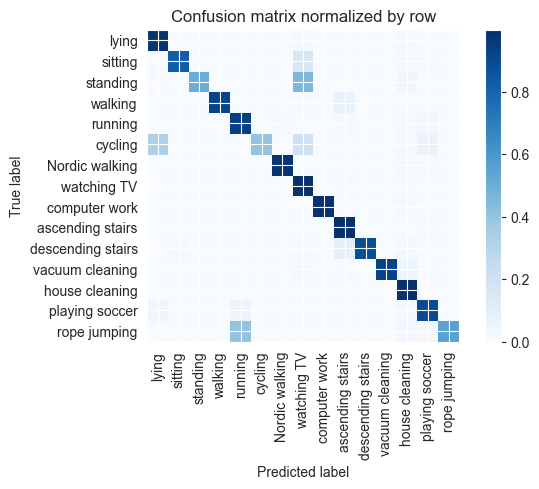

Overall accuracy: 0.866

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.989      0.994      0.138        616|	 house cleaning: 0.008,	lying: 0.003,	
          walking       1.000      0.917      0.957      0.100        446|	 ascending stairs: 0.070,	watching TV: 0.007,	
   Nordic walking       0.989      0.981      0.985      0.082        368|	 house cleaning: 0.011,	playing soccer: 0.005,	
          sitting       0.990      0.821      0.898      0.081        363|	 watching TV: 0.152,	house cleaning: 0.011,	
            lying       0.760      0.981      0.856      0.081        362|	 house cleaning: 0.011,	watching TV: 0.008,	
   house cleaning       0.854      0.997      0.920      0.080        357|	 lying: 0.003,	rope jumping: 0.000,	
         standing       0.994      0.500      0.665      0.077        346|	 watching TV: 0.454,	house cleaning: 0.035,	
  vacuum cleaning       1.000      0.926      0.961

unseen: 100%|██████████| 60/60 [00:06<00:00,  9.36batch/s, loss=27.8]


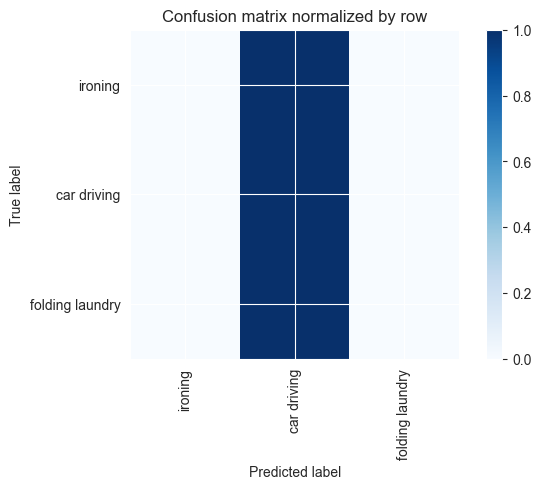

Overall accuracy: 0.140

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.000      0.000      0.000      0.608       2333|	 car driving: 1.000,	folding laundry: 0.000,	
folding laundry       0.000      0.000      0.000      0.252        969|	 car driving: 1.000,	ironing: 0.000,	
    car driving       0.140      1.000      0.246      0.140        538|	 folding laundry: 0.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.020      0.140      0.034        1.0       3840|	      

{'accuracy': 0.14010416666666667, 'precision': 0.04670138888888889, 'recall': 0.3333333333333333, 'f1': 0.08192477539211207}
============== Overall Unseen Classes Performance ==============


accuracy     0.338203
precision    0.332337
recall       0.403656
f1           0.271445
dtype: float64

In [78]:
fold_metric_scores = []
for i, cs in enumerate(fold_cls_ids):
    print("="*16, f'Fold-{i}', "="*16)
    print(f'Unseen Classes : {fold_classes[i]}')

    data_dict = dataReader.generate(unseen_classes=cs, seen_ratio=config['seen_split'], unseen_ratio=config['unseen_split'], window_size=5.21, window_overlap=4.21, resample_freq=20)
    all_classes = dataReader.idToLabel
    seen_classes = data_dict['seen_classes']
    unseen_classes = data_dict['unseen_classes']
    print("seen classes > ", seen_classes)
    print("unseen classes > ", unseen_classes)
    train_n, in_ft = data_dict['train']['X'].shape

    print("Initiate IMU datasets ...")
    # build IMU datasets
    train_dt = PAMAP2Dataset(data=data_dict['train']['X'], actions=data_dict['train']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=seen_classes, seq_len=100)
    train_dl = DataLoader(train_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    # build seen eval_dt
    eval_dt = PAMAP2Dataset(data=data_dict['eval-seen']['X'], actions=data_dict['eval-seen']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=seen_classes, seq_len=100)
    eval_dl = DataLoader(eval_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    # build unseen test_dt
    test_dt = PAMAP2Dataset(data=data_dict['test']['X'], actions=data_dict['test']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=unseen_classes, seq_len=100)
    test_dl = DataLoader(test_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    
    # build model
    model = SOTAEmbedding(
        linear_filters=config["model_params"]["linear_filters"],
        input_feat=config["model_params"]["input_feat"],
        dropout=config["model_params"]["dropout"]
    )
    # model = Model1(feat_dim=in_ft, max_len=seq_len, d_model=config['d_model'], n_heads=config['num_heads'], num_layers=2, dim_feedforward=128, ft_size=feat_size)
    model.to(device)
    # define run parameters 
    optimizer = Adam(model.parameters(), lr=config['lr'],weight_decay=1e-5)
    loss_module = {'class': nn.CrossEntropyLoss(reduction="sum"), 'feature': nn.L1Loss(reduction="sum")}
    best_acc = 0.0
    # train the model 
    for epoch in tqdm(range(config['n_epochs']), desc='Training Epoch', leave=False):
        train_metrics = train_step(model, train_dl, train_dt,optimizer, loss_module, device, class_names=[all_classes[i] for i in seen_classes], phase='train', loss_alpha=0.0001)
        eval_metrics = eval_step(model, eval_dl, eval_dt,loss_module, device, class_names=[all_classes[i] for i in seen_classes], phase='seen', print_report=True, loss_alpha=0.0001)
        # print(f"EPOCH [{epoch}] TRAINING : {train_metrics}")
        # print(f"EPOCH [{epoch}] EVAL : {eval_metrics}")
        if eval_metrics['accuracy'] > best_acc:
            best_model = deepcopy(model.state_dict())
    
    # replace by best model 
    model.load_state_dict(best_model)
    save_model(model,notebook_iden,model_iden,i)

    # run evaluation on unseen classes
    test_metrics = eval_step(model, test_dl,test_dt, loss_module, device, class_names=[all_classes[i] for i in unseen_classes],   phase='unseen', loss_alpha=0.0001)
    fold_metric_scores.append(test_metrics)
    print(test_metrics)
    print("="*40)

print("="*14, "Overall Unseen Classes Performance", "="*14)
seen_score_df = pd.DataFrame.from_records(fold_metric_scores)
seen_score_df.mean()
